# Imports And Consts

In [1]:
import functions
import numpy as np
import pandas as pd
import seaborn as sns
import pickle
from sklearn.feature_selection import f_classif, mutual_info_classif
import matplotlib.pyplot as plt
from sklearn.svm import SVC

# Load Data

load the training and test data in a format specified by task description

In [2]:
with open("./Dataset/x_test.txt") as file:
    X_test = [[float(digit) for digit in line.split()] for line in file]


with open("./Dataset/x_train.txt") as file:
    X_train = [[float(digit) for digit in line.split()] for line in file]


with open("./Dataset/y_train.txt") as file:
    y_train = [[float(digit) for digit in line.split()] for line in file]

In the X_test there are 500 features and 5000 observations, y_train contains 5000 values, X_train contains 500 features and 5000 observations

In [3]:
print("X_test datapoints:", len(X_test), " features:", len(X_test[0]))
print("X_train datapoints:", len(X_train), " features:", len(X_train[0]))
print("y_train datapoints:", len(y_train))

X_test datapoints: 5000  features: 500
X_train datapoints: 5000  features: 500
y_train datapoints: 5000


# Batch 1

## Consts

In [4]:
RESULTS_FILENAME = "./Results/Limited/results-1"

## Experiment

### Parameters

In [5]:
# LDA
solver = ["svd"]
ldaParameters = functions.generateParameters([solver], globals())

# QDA
qdaParameters = [{}]

# KNN
n_neighbors = [5]
knnParameters = functions.generateParameters([n_neighbors], globals())

# SVC
svcParameters = [{}]

# HistGradientBoosting
histGradientBoostingParameters = [{}]


# GradientBoosting
gradientBoostingParameters = [{}]


# MLPClassifier
mlpClassifierParameters = [{}]

# Voting?


models = [
    {"model": functions.ModelType.LDA, "parameters": ldaParameters},
    {"model": functions.ModelType.QDA, "parameters": qdaParameters},
    {"model": functions.ModelType.KNN, "parameters": knnParameters},
    {"model": functions.ModelType.SVC, "parameters": svcParameters},
    {
        "model": functions.ModelType.GradientBoosting,
        "parameters": gradientBoostingParameters,
    },
    {
        "model": functions.ModelType.HistGradientBoosting,
        "parameters": histGradientBoostingParameters,
    },
    {"model": functions.ModelType.MLPClassifier, "parameters": mlpClassifierParameters},
]

In [6]:
# KBest
k = [5, 10, 20, 40, 80]
score_func = [f_classif, mutual_info_classif]
kBestParameters = functions.generateParameters([score_func, k], globals())


featureSelectors = [
    {"model": functions.FeatureSelectorType.NoFeatureSelection, "parameters": [{}]},
    {"model": functions.FeatureSelectorType.KBest, "parameters": kBestParameters},
]

### Conducting the experiment

In [7]:
y_train_ravel = np.ravel(y_train, order="C")
y_train_ravel = y_train_ravel.astype(int)

In [8]:
%%time
results = functions.conductExperiments(
    models=models,
    featureSelectors=featureSelectors,
    X_orig=X_train,
    y_orig=y_train_ravel,
    getLimitedScore=True,
)
with open(RESULTS_FILENAME, "wb") as f:
    pickle.dump(results, f)

Performed Experiment 1/77(approx) took (s): model: 3.91 selector 0.0 with: FeatureSelectorType.NoFeatureSelection {} ModelType.LDA {'solver': 'svd'}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Performed Experiment 2/77(approx) took (s): model: 1.08 selector 0.0 with: FeatureSelectorType.NoFeatureSelection {} ModelType.QDA {}
Performed Experiment 3/77(approx) took (s): model: 0.77 selector 0.0 with: FeatureSelectorType.NoFeatureSelection {} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.NoFeatureSelection {} ModelType.SVC {} This 'SVC' has no attribute 'predict_proba'
Performed Experiment 4/77(approx) took (s): model: 62.13 selector 0.0 with: FeatureSelectorType.NoFeatureSelection {} ModelType.GradientBoosting {}
Performed Experiment 5/77(approx) took (s): model: 5.8 selector 0.0 with: FeatureSelectorType.NoFeatureSelection {} ModelType.HistGradientBoosting {}
Performed Experiment 6/77(approx) took (s): model: 8.15 selector 0.0 with: FeatureSelectorType.NoFeatureSelection {} ModelType.MLPClassifier {}
Performed Experiment 7/77(approx) took (s): model: 0.0 selector 0.2 with: FeatureSelectorType.KBest {'score_func': <function f_classif at 0x00000

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 24/77(approx) took (s): model: 6.02 selector 0.16 with: FeatureSelectorType.KBest {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'k': 20} ModelType.MLPClassifier {}
Performed Experiment 25/77(approx) took (s): model: 0.28 selector 0.23 with: FeatureSelectorType.KBest {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'k': 40} ModelType.LDA {'solver': 'svd'}
Performed Experiment 26/77(approx) took (s): model: 0.03 selector 0.23 with: FeatureSelectorType.KBest {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'k': 40} ModelType.QDA {}
Performed Experiment 27/77(approx) took (s): model: 0.02 selector 0.23 with: FeatureSelectorType.KBest {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'k': 40} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'k': 40} ModelType.SVC {} This 'SVC' has no attribute 'predict_proba'
Performed Experiment 28/77

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 30/77(approx) took (s): model: 5.68 selector 0.23 with: FeatureSelectorType.KBest {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'k': 40} ModelType.MLPClassifier {}
Performed Experiment 31/77(approx) took (s): model: 1.17 selector 0.2 with: FeatureSelectorType.KBest {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'k': 80} ModelType.LDA {'solver': 'svd'}
Performed Experiment 32/77(approx) took (s): model: 0.11 selector 0.2 with: FeatureSelectorType.KBest {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'k': 80} ModelType.QDA {}
Performed Experiment 33/77(approx) took (s): model: 0.03 selector 0.2 with: FeatureSelectorType.KBest {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'k': 80} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'k': 80} ModelType.SVC {} This 'SVC' has no attribute 'predict_proba'
Performed Experiment 34/77(ap

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 36/77(approx) took (s): model: 6.63 selector 0.2 with: FeatureSelectorType.KBest {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'k': 80} ModelType.MLPClassifier {}
Performed Experiment 37/77(approx) took (s): model: 0.01 selector 10.22 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 5} ModelType.LDA {'solver': 'svd'}
Performed Experiment 38/77(approx) took (s): model: 0.0 selector 10.22 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 5} ModelType.QDA {}
Performed Experiment 39/77(approx) took (s): model: 0.02 selector 10.22 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 5} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 5} ModelType.SVC {} This 'SVC' has no attribute 'pred

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 42/77(approx) took (s): model: 4.33 selector 10.22 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 5} ModelType.MLPClassifier {}
Performed Experiment 43/77(approx) took (s): model: 0.02 selector 8.33 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 10} ModelType.LDA {'solver': 'svd'}
Performed Experiment 44/77(approx) took (s): model: 0.0 selector 8.33 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 10} ModelType.QDA {}
Performed Experiment 45/77(approx) took (s): model: 0.03 selector 8.33 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 10} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 10} ModelType.SVC {} This 'SVC' has no att

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 48/77(approx) took (s): model: 3.46 selector 8.33 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 10} ModelType.MLPClassifier {}
Performed Experiment 49/77(approx) took (s): model: 0.01 selector 7.77 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 20} ModelType.LDA {'solver': 'svd'}
Performed Experiment 50/77(approx) took (s): model: 0.01 selector 7.77 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 20} ModelType.QDA {}
Performed Experiment 51/77(approx) took (s): model: 0.02 selector 7.77 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 20} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 20} ModelType.SVC {} This 'SVC' has no at

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 54/77(approx) took (s): model: 4.67 selector 7.77 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 20} ModelType.MLPClassifier {}
Performed Experiment 55/77(approx) took (s): model: 0.02 selector 7.56 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 40} ModelType.LDA {'solver': 'svd'}
Performed Experiment 56/77(approx) took (s): model: 0.02 selector 7.56 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 40} ModelType.QDA {}
Performed Experiment 57/77(approx) took (s): model: 0.02 selector 7.56 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 40} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 40} ModelType.SVC {} This 'SVC' has no at

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 60/77(approx) took (s): model: 4.93 selector 7.56 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 40} ModelType.MLPClassifier {}
Performed Experiment 61/77(approx) took (s): model: 0.07 selector 8.17 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 80} ModelType.LDA {'solver': 'svd'}
Performed Experiment 62/77(approx) took (s): model: 0.08 selector 8.17 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 80} ModelType.QDA {}
Performed Experiment 63/77(approx) took (s): model: 0.03 selector 8.17 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 80} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 80} ModelType.SVC {} This 'SVC' has no at

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


## Results

In [9]:
with open(RESULTS_FILENAME, "rb") as input_file:
    results = pickle.load(input_file)

In [10]:
resultsDf = pd.DataFrame(
    results,
    columns=functions.RESULTS_COLUMNS,
)

### Detailed Results

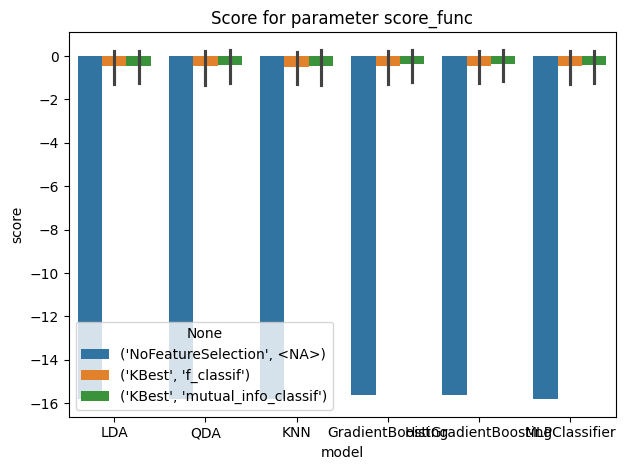

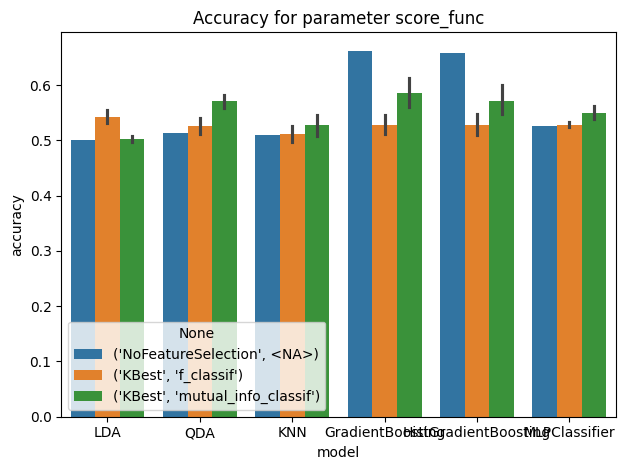

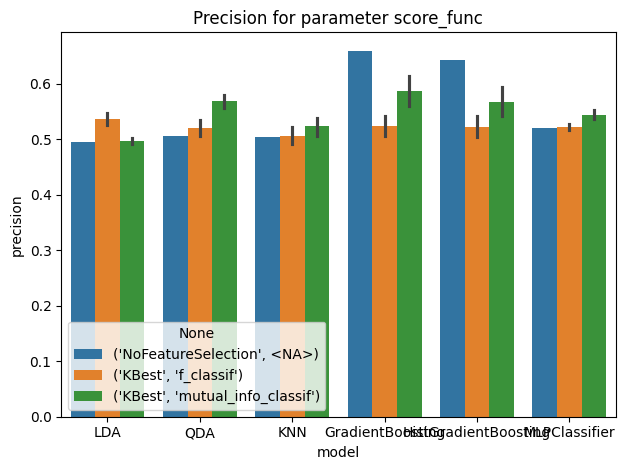

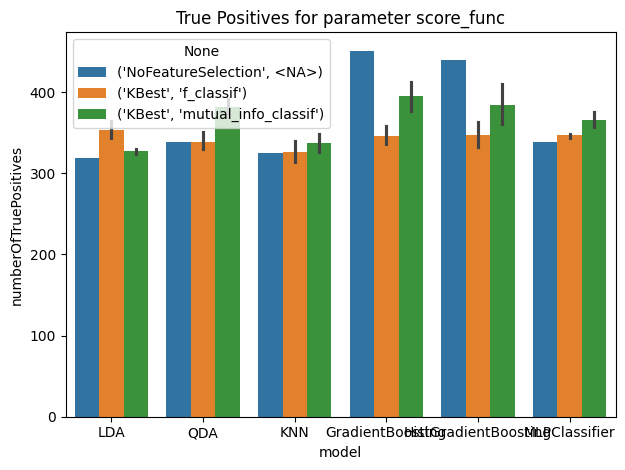

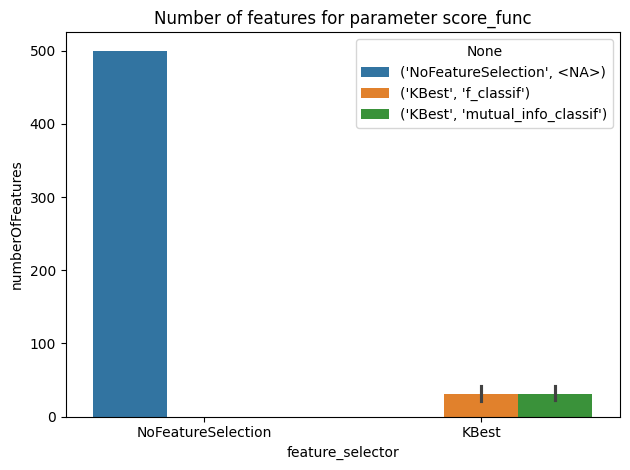

...

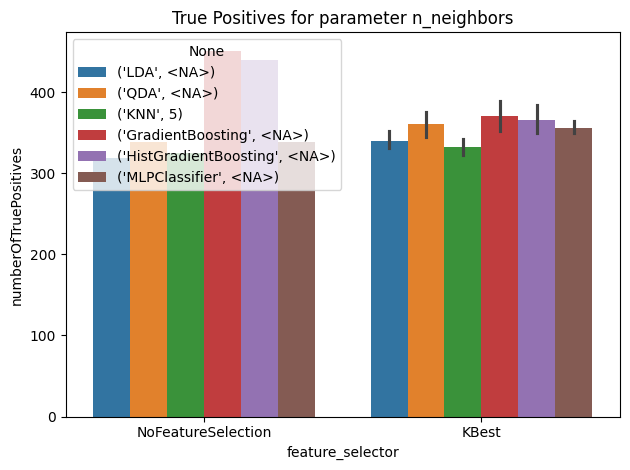

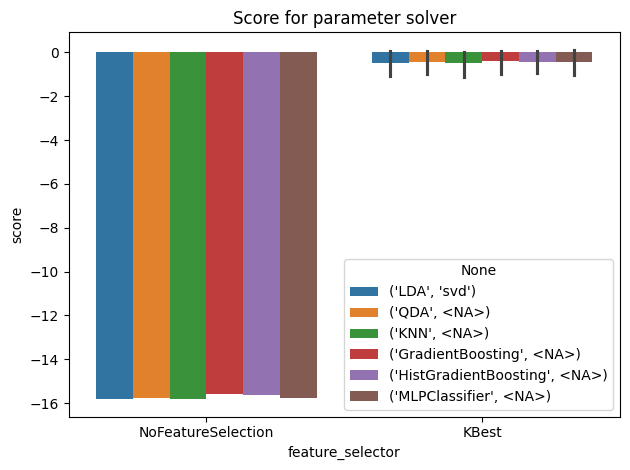

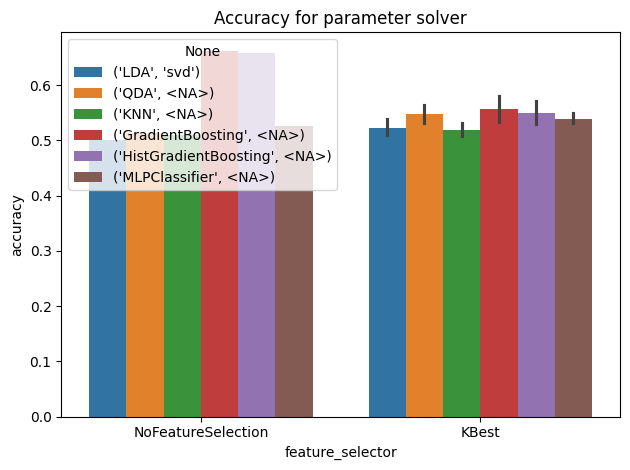

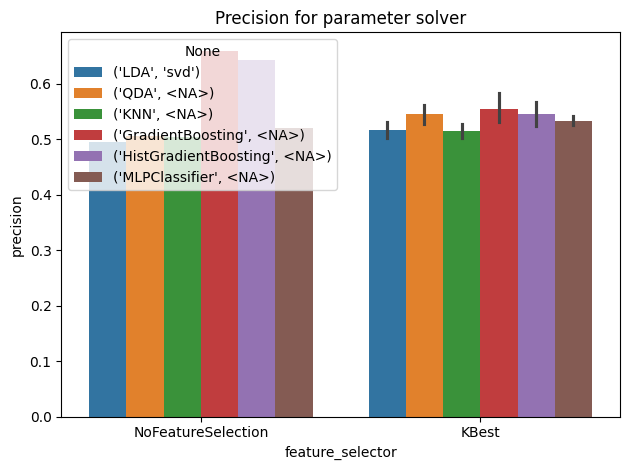

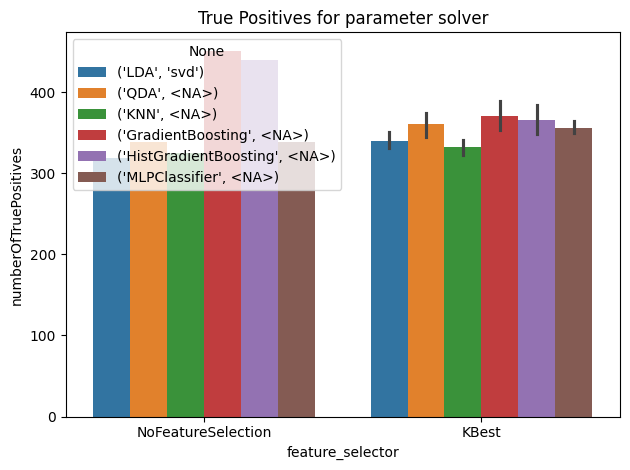

CPU times: total: 3.83 s
Wall time: 7.08 s


In [11]:
%%time
processedResultsDf, parameters = functions.extractParameterResults(
    resultsDf, models, featureSelectors
)
functions.drawParameterResultsBarplot(processedResultsDf, parameters)

### Score/Accuracy by number of features

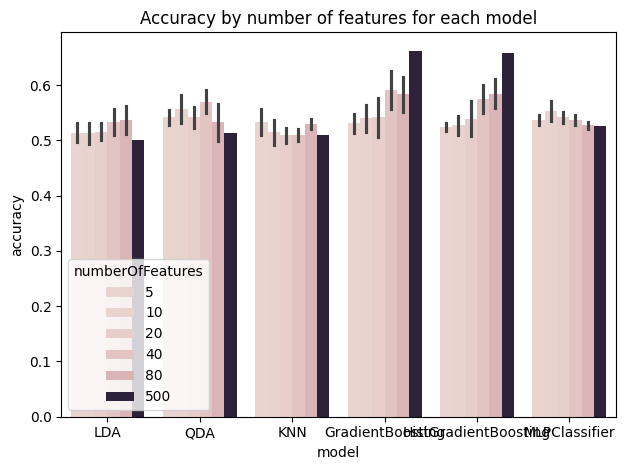

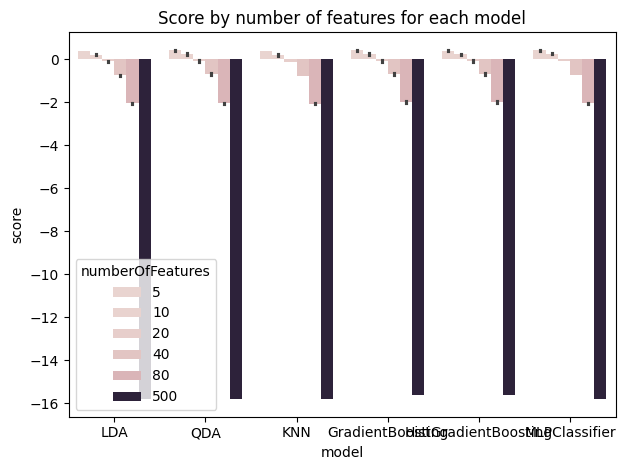

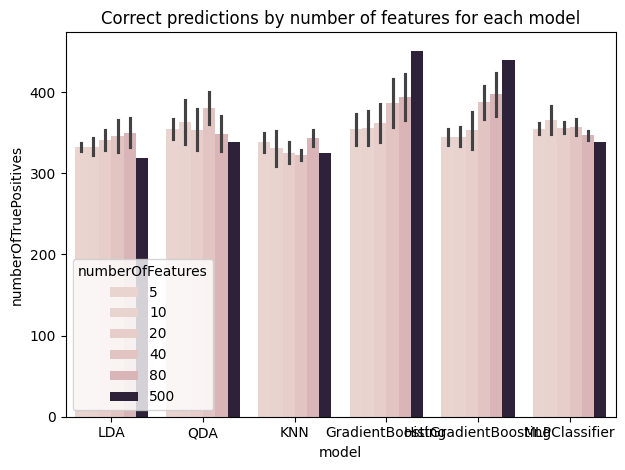

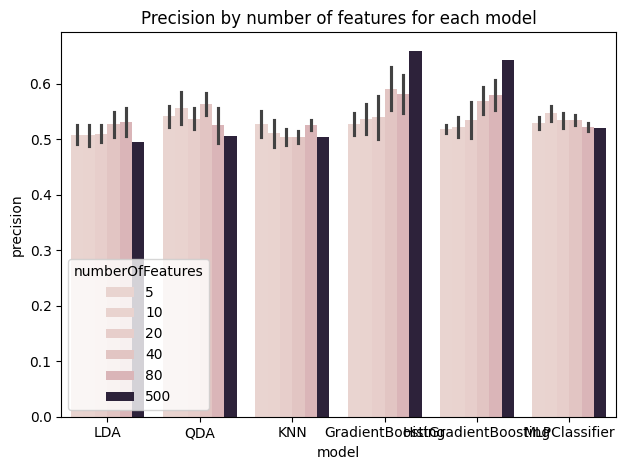

In [12]:
functions.drawResultsPerNumberOfFeatures(processedResultsDf)

### Final Results for Feature Selectors

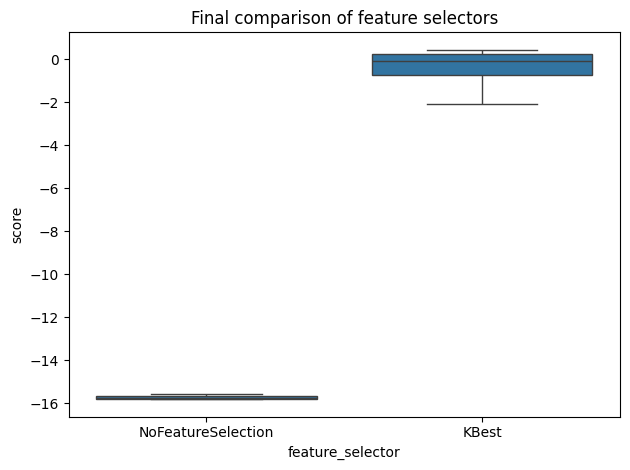

In [13]:
plt.title("Final comparison of feature selectors")
sns.boxplot(data=processedResultsDf, x="feature_selector", y="score")

plt.tight_layout()
plt.show()

### Final Results for Models

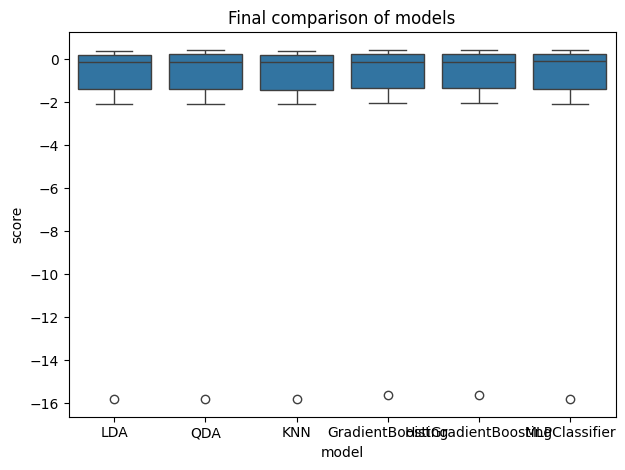

In [14]:
plt.title("Final comparison of models")
sns.boxplot(data=processedResultsDf, x="model", y="score")

plt.tight_layout()
plt.show()

### Final Results

In [15]:
%%time
filteredDf = functions.filterDataframeByBestResults(processedResultsDf)

CPU times: total: 0 ns
Wall time: 0 ns


In [16]:
filteredDf

,score,numberOfTruePositives,accuracy,precision,numberOfFeatures,model,model_parameters,feature_selector,selector_parameters,selector_parameters_score_func,selector_parameters_k,model_parameters_n_neighbors,model_parameters_solver
39,0.446078,373,0.547879,0.547297,5,GradientBoosting,{},KBest,{'score_func': <function mutual_info_classif a...,mutual_info_classif,5,<NA>,<NA>


# Batch 2

## Consts

In [20]:
RESULTS_FILENAME = "./Results/Limited/results-2"

## Experiment

### Parameters

In [21]:
# LDA
solver = ["svd"]
ldaParameters = functions.generateParameters([solver], globals())

# QDA
qdaParameters = [{}]

# KNN
n_neighbors = [5]
knnParameters = functions.generateParameters([n_neighbors], globals())

# SVC
svcParameters = [{}]

# HistGradientBoosting
histGradientBoostingParameters = [{}]


# GradientBoosting
gradientBoostingParameters = [{}]


# MLPClassifier
mlpClassifierParameters = [{}]

# Voting?


models = [
    {"model": functions.ModelType.LDA, "parameters": ldaParameters},
    {"model": functions.ModelType.QDA, "parameters": qdaParameters},
    {"model": functions.ModelType.KNN, "parameters": knnParameters},
    {"model": functions.ModelType.SVC, "parameters": svcParameters},
    {
        "model": functions.ModelType.GradientBoosting,
        "parameters": gradientBoostingParameters,
    },
    {
        "model": functions.ModelType.HistGradientBoosting,
        "parameters": histGradientBoostingParameters,
    },
    {"model": functions.ModelType.MLPClassifier, "parameters": mlpClassifierParameters},
]

In [22]:
# KBest
k = [2, 5, 10]
score_func = [mutual_info_classif]
kBestParameters = functions.generateParameters([score_func, k], globals())

# FPR

# mutual_info_classif seems to break for FPR but maybe try to run these without StandardScaler?
score_func = [f_classif]
alpha = [0.01, 0.05, 0.1, 0.2]
fprParameters = functions.generateParameters([score_func, alpha], globals())

# FDR
score_func = [f_classif]
alpha = [0.01, 0.05, 0.1, 0.2]
fdrParameters = functions.generateParameters([score_func, alpha], globals())

# FWE
score_func = [f_classif]
alpha = [0.01, 0.05, 0.1, 0.2]
fweParameters = functions.generateParameters([score_func, alpha], globals())


featureSelectors = [
    {"model": functions.FeatureSelectorType.NoFeatureSelection, "parameters": [{}]},
    {"model": functions.FeatureSelectorType.KBest, "parameters": kBestParameters},
    {"model": functions.FeatureSelectorType.FPR, "parameters": fprParameters},
    {"model": functions.FeatureSelectorType.FDR, "parameters": fdrParameters},
    {"model": functions.FeatureSelectorType.FWE, "parameters": fweParameters},
]

### Conducting the experiment

In [23]:
y_train_ravel = np.ravel(y_train, order="C")
y_train_ravel = y_train_ravel.astype(int)

In [24]:
%%time
results = functions.conductExperiments(
    models=models,
    featureSelectors=featureSelectors,
    X_orig=X_train,
    y_orig=y_train_ravel,
    getLimitedScore=True,
)
with open(RESULTS_FILENAME, "wb") as f:
    pickle.dump(results, f)

Performed Experiment 1/112(approx) took (s): model: 10.85 selector 0.0 with: FeatureSelectorType.NoFeatureSelection {} ModelType.LDA {'solver': 'svd'}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\discriminant_analysis.py:935: UserWarning: Variables are collinear
  warnings.warn("Variables are collinear")


Performed Experiment 2/112(approx) took (s): model: 1.07 selector 0.0 with: FeatureSelectorType.NoFeatureSelection {} ModelType.QDA {}
Performed Experiment 3/112(approx) took (s): model: 0.19 selector 0.0 with: FeatureSelectorType.NoFeatureSelection {} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.NoFeatureSelection {} ModelType.SVC {} This 'SVC' has no attribute 'predict_proba'
Performed Experiment 4/112(approx) took (s): model: 58.66 selector 0.0 with: FeatureSelectorType.NoFeatureSelection {} ModelType.GradientBoosting {}
Performed Experiment 5/112(approx) took (s): model: 6.1 selector 0.0 with: FeatureSelectorType.NoFeatureSelection {} ModelType.HistGradientBoosting {}
Performed Experiment 6/112(approx) took (s): model: 8.58 selector 0.0 with: FeatureSelectorType.NoFeatureSelection {} ModelType.MLPClassifier {}
Performed Experiment 7/112(approx) took (s): model: 0.02 selector 6.78 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 24/112(approx) took (s): model: 3.0 selector 6.21 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 10} ModelType.MLPClassifier {}
Performed Experiment 25/112(approx) took (s): model: 0.02 selector 0.15 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.01} ModelType.LDA {'solver': 'svd'}
Performed Experiment 26/112(approx) took (s): model: 0.0 selector 0.15 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.01} ModelType.QDA {}
Performed Experiment 27/112(approx) took (s): model: 0.02 selector 0.15 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.01} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.01} ModelType.SVC {} This 'SVC' has no attribute 'predict_proba

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 36/112(approx) took (s): model: 4.08 selector 0.16 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.05} ModelType.MLPClassifier {}
Performed Experiment 37/112(approx) took (s): model: 0.02 selector 0.17 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.1} ModelType.LDA {'solver': 'svd'}
Performed Experiment 38/112(approx) took (s): model: 0.06 selector 0.17 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.1} ModelType.QDA {}
Performed Experiment 39/112(approx) took (s): model: 0.01 selector 0.17 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.1} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.1} ModelType.SVC {} This 'SVC' has no attribute 'predict_proba'
Perfor

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 42/112(approx) took (s): model: 4.32 selector 0.17 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.1} ModelType.MLPClassifier {}
Performed Experiment 43/112(approx) took (s): model: 0.05 selector 0.18 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.2} ModelType.LDA {'solver': 'svd'}
Performed Experiment 44/112(approx) took (s): model: 0.1 selector 0.18 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.2} ModelType.QDA {}
Performed Experiment 45/112(approx) took (s): model: 0.02 selector 0.18 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.2} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.2} ModelType.SVC {} This 'SVC' has no attribute 'predict_proba'
Performe

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 48/112(approx) took (s): model: 5.06 selector 0.18 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.2} ModelType.MLPClassifier {}
!!! FeatureSelectorType.FDR produced 1 or fewer features with parameters: {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.01}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\feature_selection\_base.py:121: UserWarning: No features were selected: either the data is too noisy or the selection test too strict.
  warnings.warn(
c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\feature_selection\_base.py:121: UserWarning: No features were selected: either the data is too noisy or the selection test too strict.
  warnings.warn(


!!! FeatureSelectorType.FDR produced 1 or fewer features with parameters: {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.05}
!!! FeatureSelectorType.FDR produced 1 or fewer features with parameters: {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.1}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\feature_selection\_base.py:121: UserWarning: No features were selected: either the data is too noisy or the selection test too strict.
  warnings.warn(
c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\feature_selection\_base.py:121: UserWarning: No features were selected: either the data is too noisy or the selection test too strict.
  warnings.warn(


!!! FeatureSelectorType.FDR produced 1 or fewer features with parameters: {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.2}
!!! FeatureSelectorType.FWE produced 1 or fewer features with parameters: {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.01}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\feature_selection\_base.py:121: UserWarning: No features were selected: either the data is too noisy or the selection test too strict.
  warnings.warn(
c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\feature_selection\_base.py:121: UserWarning: No features were selected: either the data is too noisy or the selection test too strict.
  warnings.warn(


!!! FeatureSelectorType.FWE produced 1 or fewer features with parameters: {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.05}
!!! FeatureSelectorType.FWE produced 1 or fewer features with parameters: {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.1}
!!! FeatureSelectorType.FWE produced 1 or fewer features with parameters: {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.2}
CPU times: total: 3min 28s
Wall time: 2min 37s


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\feature_selection\_base.py:121: UserWarning: No features were selected: either the data is too noisy or the selection test too strict.
  warnings.warn(
c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\feature_selection\_base.py:121: UserWarning: No features were selected: either the data is too noisy or the selection test too strict.
  warnings.warn(


## Results

In [25]:
with open(RESULTS_FILENAME, "rb") as input_file:
    results = pickle.load(input_file)

In [26]:
resultsDf = pd.DataFrame(
    results,
    columns=functions.RESULTS_COLUMNS,
)

### Detailed Results

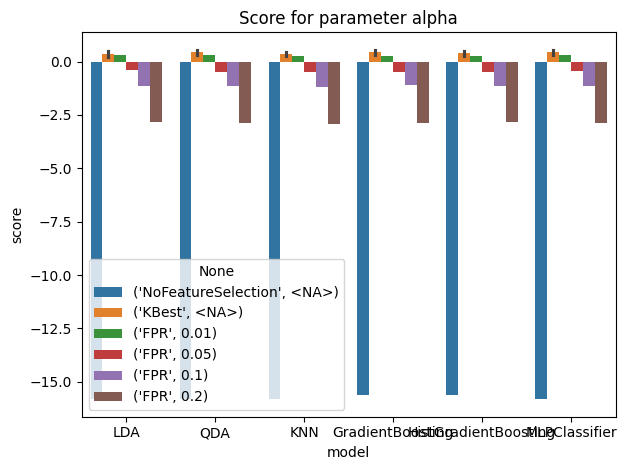

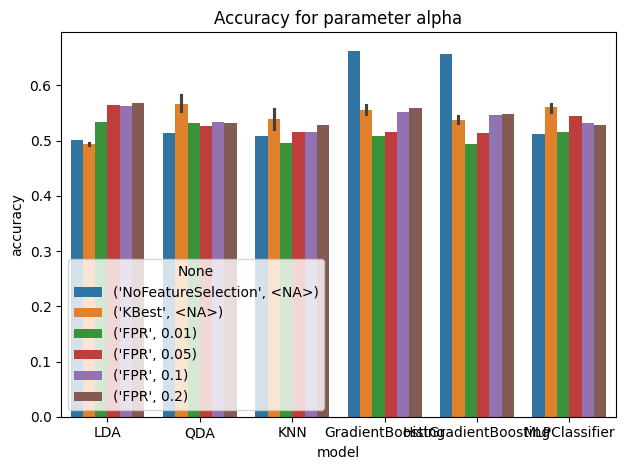

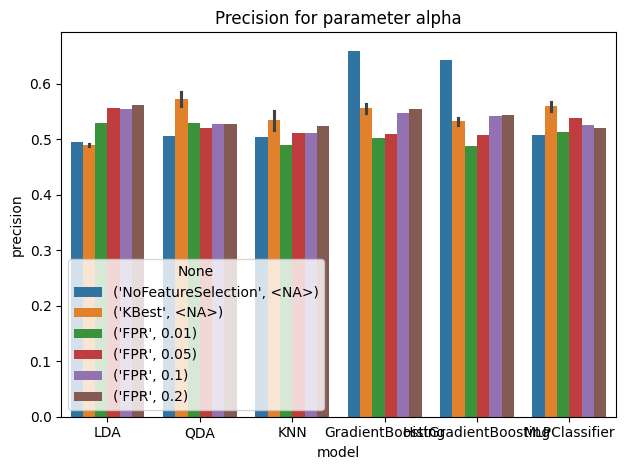

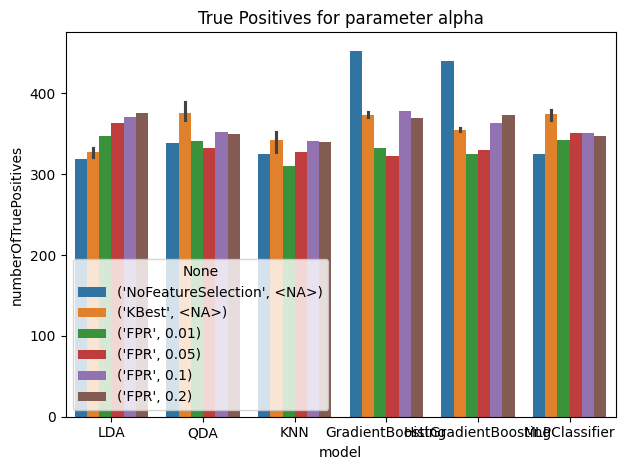

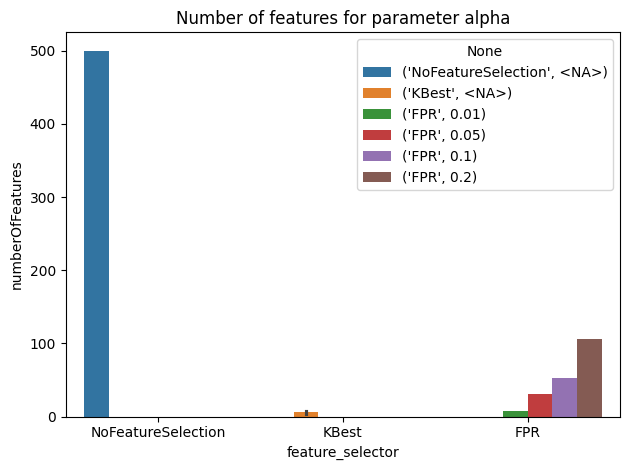

...

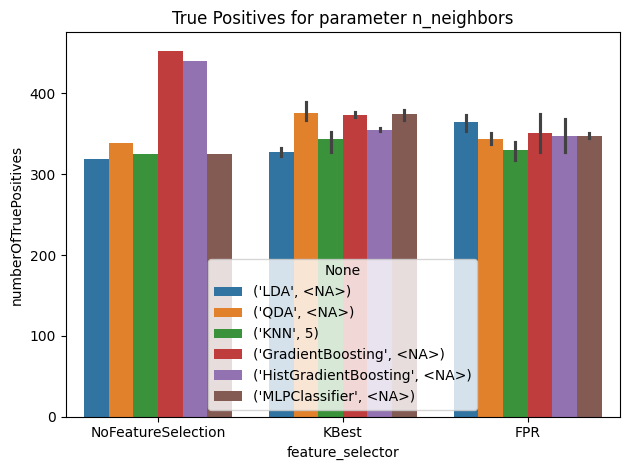

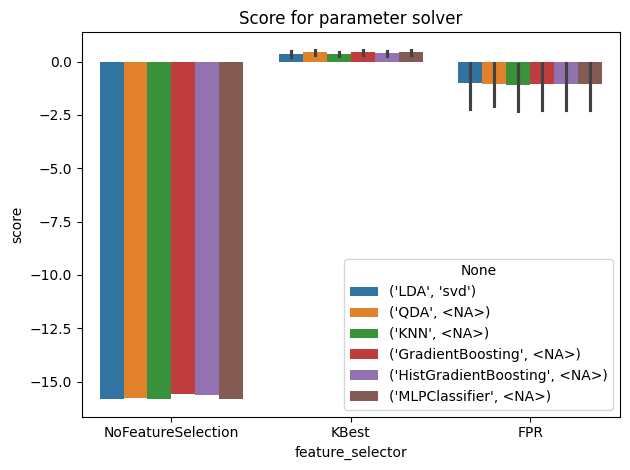

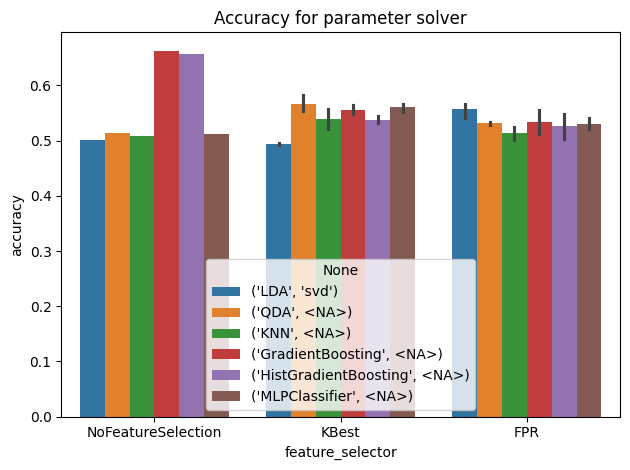

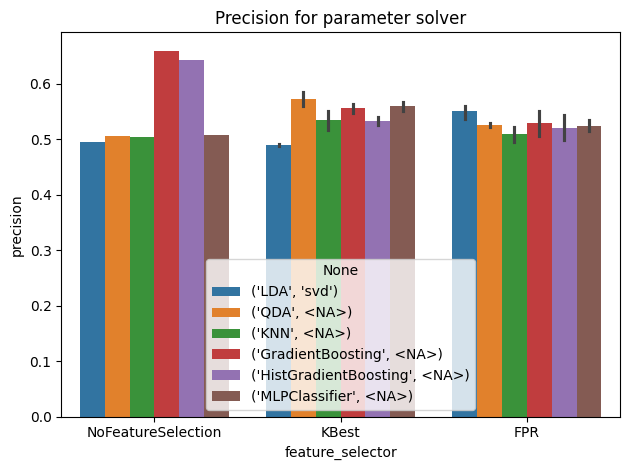

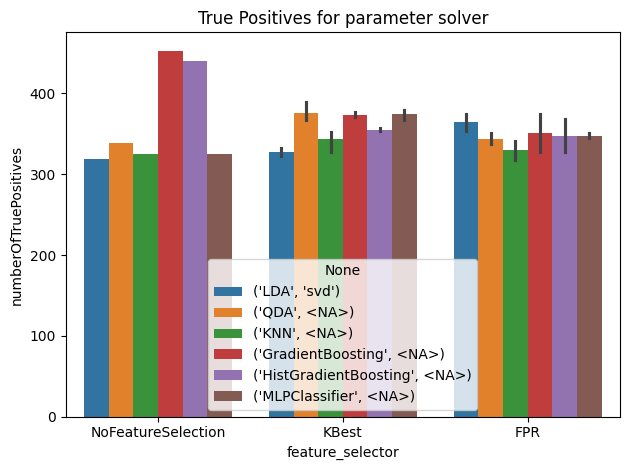

CPU times: total: 5.33 s
Wall time: 7.48 s


In [27]:
%%time
processedResultsDf, parameters = functions.extractParameterResults(
    resultsDf, models, featureSelectors
)
functions.drawParameterResultsBarplot(processedResultsDf, parameters)

### Score/Accuracy by number of features

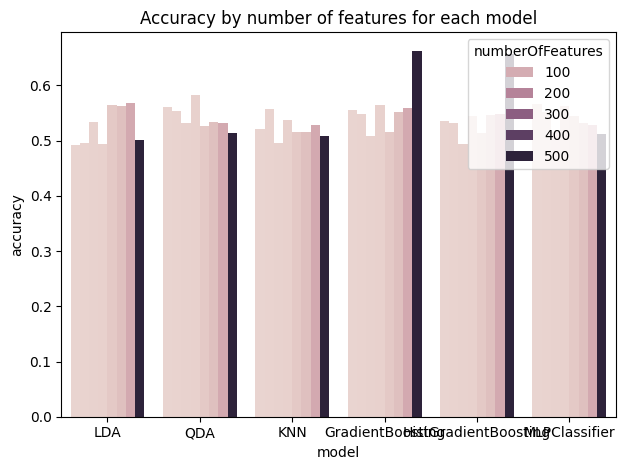

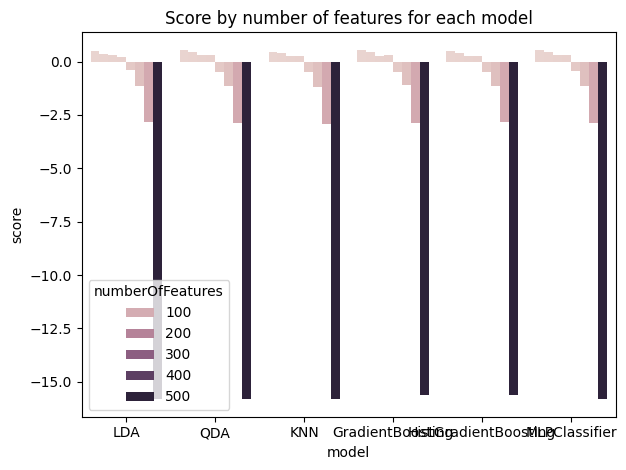

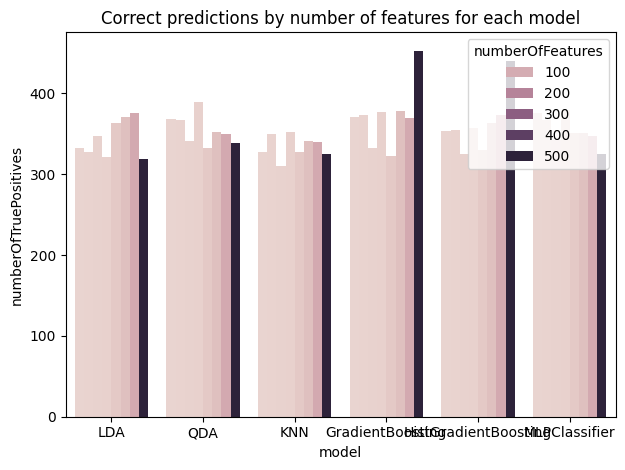

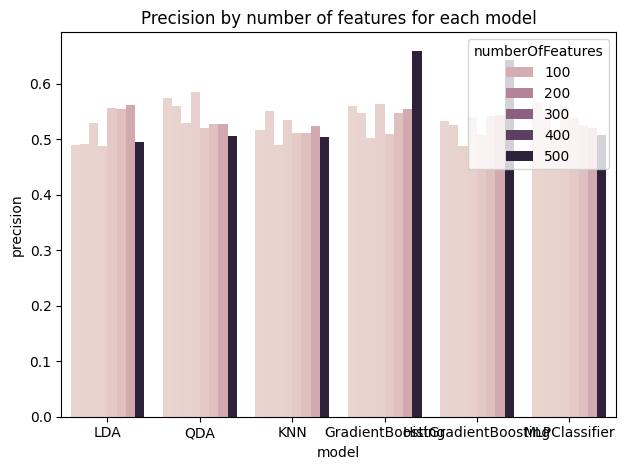

In [28]:
functions.drawResultsPerNumberOfFeatures(processedResultsDf)

### Final Results for Feature Selectors

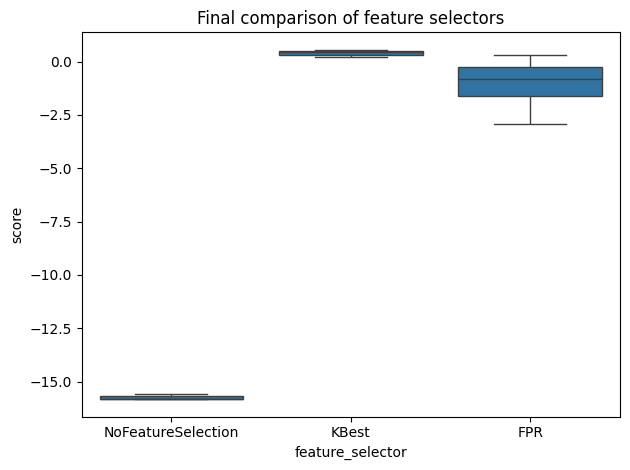

In [29]:
plt.title("Final comparison of feature selectors")
sns.boxplot(data=processedResultsDf, x="feature_selector", y="score")

plt.tight_layout()
plt.show()

### Final Results for Models

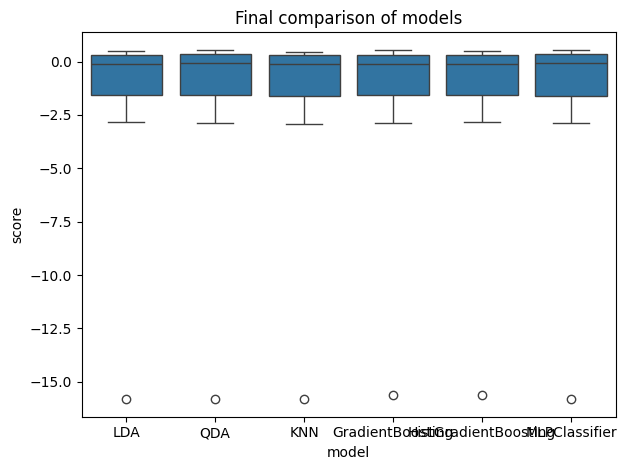

In [30]:
plt.title("Final comparison of models")
sns.boxplot(data=processedResultsDf, x="model", y="score")

plt.tight_layout()
plt.show()

### Final Results

In [31]:
%%time
filteredDf = functions.filterDataframeByBestResults(processedResultsDf)

CPU times: total: 0 ns
Wall time: 0 ns


In [32]:
filteredDf

,score,numberOfTruePositives,accuracy,precision,numberOfFeatures,model,model_parameters,feature_selector,selector_parameters,selector_parameters_alpha,selector_parameters_score_func,selector_parameters_k,model_parameters_n_neighbors,model_parameters_solver
11,0.54902,376,0.566061,0.568306,2,MLPClassifier,{},KBest,{'score_func': <function mutual_info_classif a...,<NA>,mutual_info_classif,2,<NA>,<NA>


# Batch 3

## Consts

In [33]:
RESULTS_FILENAME = "./Results/Limited/results-3"

## Experiment

### Parameters

In [34]:
# LDA
solver = ["svd"]
ldaParameters = functions.generateParameters([solver], globals())

# QDA
qdaParameters = [{}]

# KNN
n_neighbors = [5]
knnParameters = functions.generateParameters([n_neighbors], globals())

# SVC
svcParameters = [{}]

# HistGradientBoosting
histGradientBoostingParameters = [{}]


# GradientBoosting
gradientBoostingParameters = [{}]

# MLPClassifier
mlpClassifierParameters = [{}]

# Voting?


models = [
    {"model": functions.ModelType.LDA, "parameters": ldaParameters},
    {"model": functions.ModelType.QDA, "parameters": qdaParameters},
    {"model": functions.ModelType.KNN, "parameters": knnParameters},
    {"model": functions.ModelType.SVC, "parameters": svcParameters},
    {
        "model": functions.ModelType.GradientBoosting,
        "parameters": gradientBoostingParameters,
    },
    {
        "model": functions.ModelType.HistGradientBoosting,
        "parameters": histGradientBoostingParameters,
    },
    {"model": functions.ModelType.MLPClassifier, "parameters": mlpClassifierParameters},
]

In [35]:
# KBest
k = [2, 3, 4, 5, 6, 7, 8, 9, 10]
score_func = [mutual_info_classif]
kBestParameters = functions.generateParameters([score_func, k], globals())

# FPR

# mutual_info_classif seems to break for FPR but maybe try to run these without StandardScaler?
score_func = [f_classif]
alpha = [0.01, 0.05]
fprParameters = functions.generateParameters([score_func, alpha], globals())

# FDR
score_func = [f_classif]
alpha = [0.8]
fdrParameters = functions.generateParameters([score_func, alpha], globals())

# FWE
score_func = [f_classif]
alpha = [0.8]
fweParameters = functions.generateParameters([score_func, alpha], globals())


featureSelectors = [
    {"model": functions.FeatureSelectorType.KBest, "parameters": kBestParameters},
    {"model": functions.FeatureSelectorType.FPR, "parameters": fprParameters},
    {"model": functions.FeatureSelectorType.FDR, "parameters": fdrParameters},
    {"model": functions.FeatureSelectorType.FWE, "parameters": fweParameters},
]

### Conducting the experiment

In [36]:
y_train_ravel = np.ravel(y_train, order="C")
y_train_ravel = y_train_ravel.astype(int)

In [37]:
%%time
results = functions.conductExperiments(
    models=models,
    featureSelectors=featureSelectors,
    X_orig=X_train,
    y_orig=y_train_ravel,
    getLimitedScore=True,
)
with open(RESULTS_FILENAME, "wb") as f:
    pickle.dump(results, f)

Performed Experiment 1/91(approx) took (s): model: 0.0 selector 6.59 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.LDA {'solver': 'svd'}
Performed Experiment 2/91(approx) took (s): model: 0.0 selector 6.59 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.QDA {}
Performed Experiment 3/91(approx) took (s): model: 0.0 selector 6.59 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.SVC {} This 'SVC' has no attribute 'predict_proba'
Performed Experiment 4/91(approx) took (s): model: 0.28 selector 6.59 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.Gradi

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 24/91(approx) took (s): model: 2.31 selector 6.49 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 5} ModelType.MLPClassifier {}
Performed Experiment 25/91(approx) took (s): model: 0.0 selector 6.52 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 6} ModelType.LDA {'solver': 'svd'}
Performed Experiment 26/91(approx) took (s): model: 0.0 selector 6.52 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 6} ModelType.QDA {}
Performed Experiment 27/91(approx) took (s): model: 0.01 selector 6.52 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 6} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 6} ModelType.SVC {} This 'SVC' has no attribute

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 30/91(approx) took (s): model: 2.82 selector 6.52 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 6} ModelType.MLPClassifier {}
Performed Experiment 31/91(approx) took (s): model: 0.01 selector 7.11 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 7} ModelType.LDA {'solver': 'svd'}
Performed Experiment 32/91(approx) took (s): model: 0.01 selector 7.11 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 7} ModelType.QDA {}
Performed Experiment 33/91(approx) took (s): model: 0.03 selector 7.11 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 7} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 7} ModelType.SVC {} This 'SVC' has no attribu

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 36/91(approx) took (s): model: 2.49 selector 7.11 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 7} ModelType.MLPClassifier {}
Performed Experiment 37/91(approx) took (s): model: 0.0 selector 8.71 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 8} ModelType.LDA {'solver': 'svd'}
Performed Experiment 38/91(approx) took (s): model: 0.0 selector 8.71 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 8} ModelType.QDA {}
Performed Experiment 39/91(approx) took (s): model: 0.02 selector 8.71 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 8} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 8} ModelType.SVC {} This 'SVC' has no attribute

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 42/91(approx) took (s): model: 2.27 selector 8.71 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 8} ModelType.MLPClassifier {}
Performed Experiment 43/91(approx) took (s): model: 0.01 selector 6.78 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 9} ModelType.LDA {'solver': 'svd'}
Performed Experiment 44/91(approx) took (s): model: 0.01 selector 6.78 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 9} ModelType.QDA {}
Performed Experiment 45/91(approx) took (s): model: 0.05 selector 6.78 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 9} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 9} ModelType.SVC {} This 'SVC' has no attribu

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 48/91(approx) took (s): model: 2.3 selector 6.78 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 9} ModelType.MLPClassifier {}
Performed Experiment 49/91(approx) took (s): model: 0.02 selector 8.31 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 10} ModelType.LDA {'solver': 'svd'}
Performed Experiment 50/91(approx) took (s): model: 0.01 selector 8.31 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 10} ModelType.QDA {}
Performed Experiment 51/91(approx) took (s): model: 0.02 selector 8.31 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 10} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 10} ModelType.SVC {} This 'SVC' has no attr

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 54/91(approx) took (s): model: 2.75 selector 8.31 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 10} ModelType.MLPClassifier {}
Performed Experiment 55/91(approx) took (s): model: 0.0 selector 0.15 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.01} ModelType.LDA {'solver': 'svd'}
Performed Experiment 56/91(approx) took (s): model: 0.0 selector 0.15 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.01} ModelType.QDA {}
Performed Experiment 57/91(approx) took (s): model: 0.01 selector 0.15 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.01} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.01} ModelType.SVC {} This 'SVC' has no attribute 'predict_proba'
Pe

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 66/91(approx) took (s): model: 4.8 selector 0.16 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.05} ModelType.MLPClassifier {}
Performed Experiment 67/91(approx) took (s): model: 0.01 selector 0.18 with: FeatureSelectorType.FDR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.8} ModelType.LDA {'solver': 'svd'}
Performed Experiment 68/91(approx) took (s): model: 0.02 selector 0.18 with: FeatureSelectorType.FDR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.8} ModelType.QDA {}
Performed Experiment 69/91(approx) took (s): model: 0.02 selector 0.18 with: FeatureSelectorType.FDR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.8} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.FDR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.8} ModelType.SVC {} This 'SVC' has no attribute 'predict_proba'
Performed E

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


## Results

In [38]:
with open(RESULTS_FILENAME, "rb") as input_file:
    results = pickle.load(input_file)

In [39]:
resultsDf = pd.DataFrame(
    results,
    columns=functions.RESULTS_COLUMNS,
)

### Detailed Results

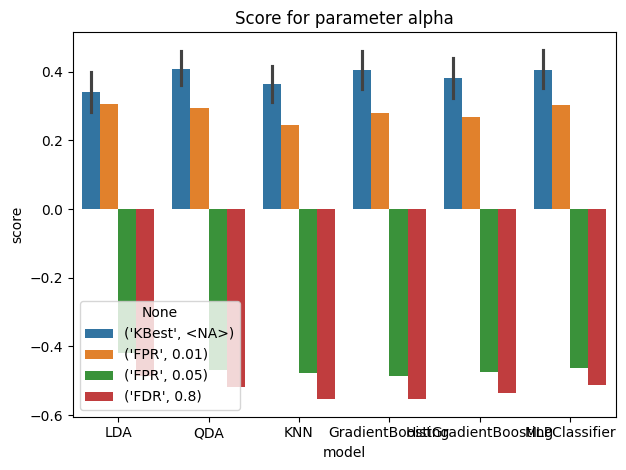

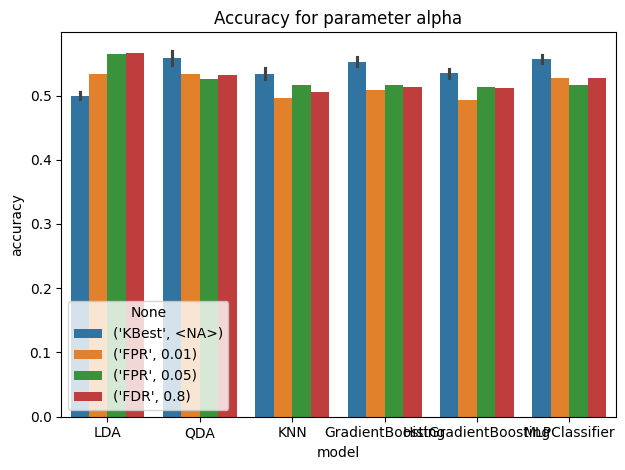

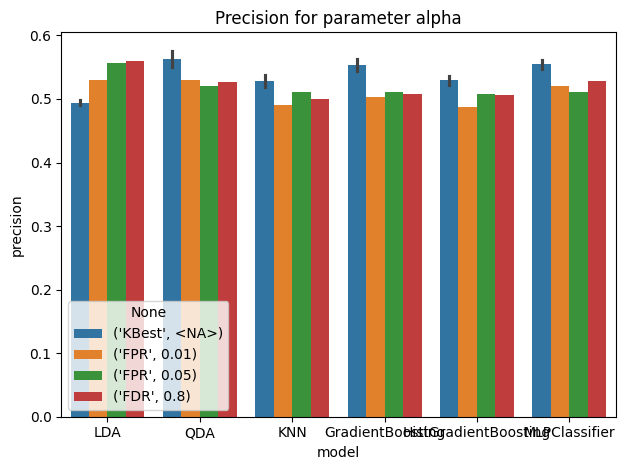

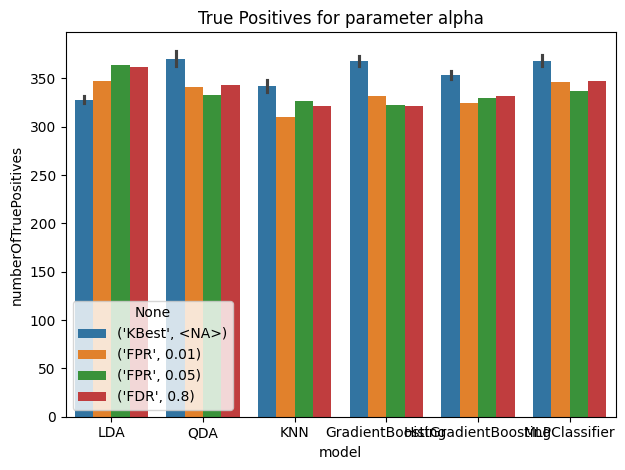

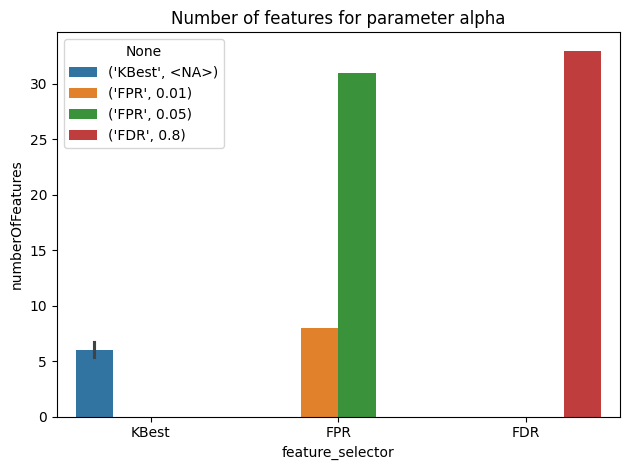

...

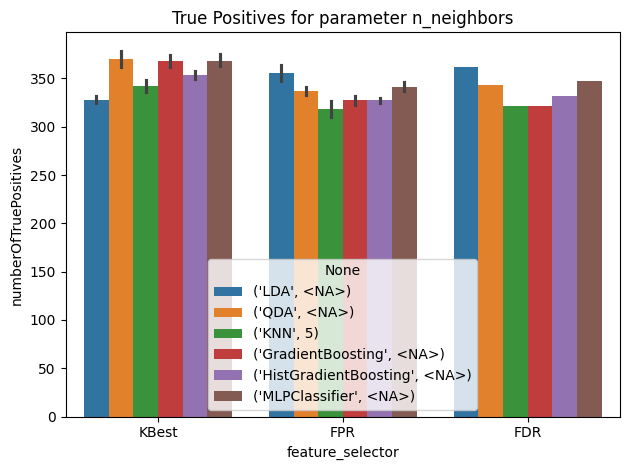

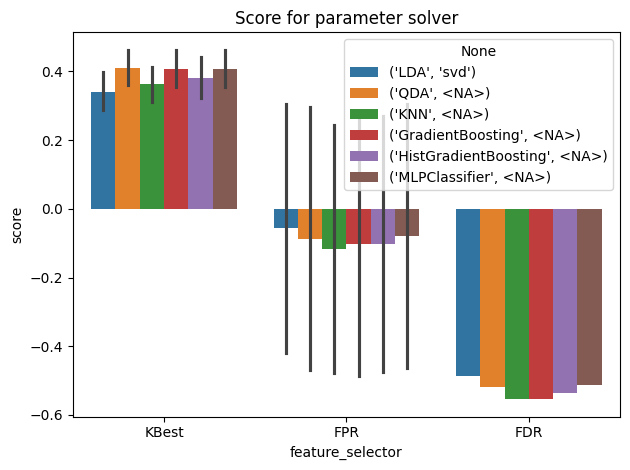

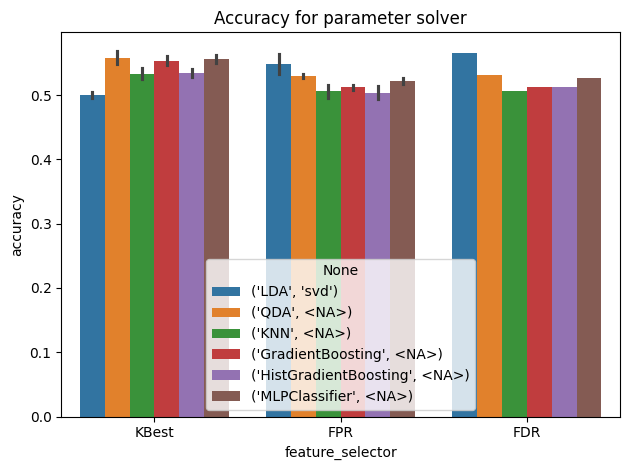

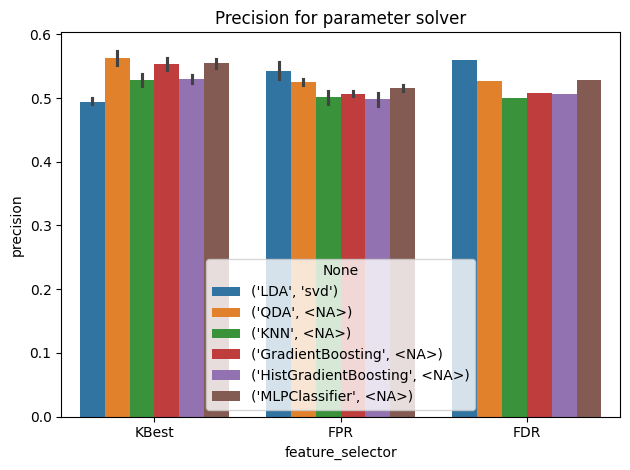

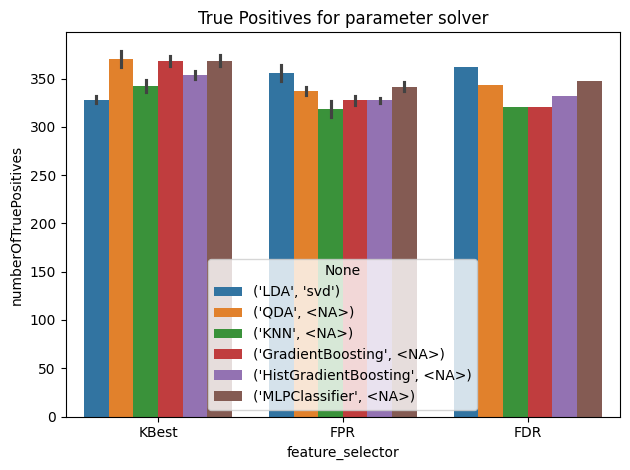

CPU times: total: 3.31 s
Wall time: 9.07 s


In [40]:
%%time
processedResultsDf, parameters = functions.extractParameterResults(
    resultsDf, models, featureSelectors
)
functions.drawParameterResultsBarplot(processedResultsDf, parameters)

### Score/Accuracy by number of features

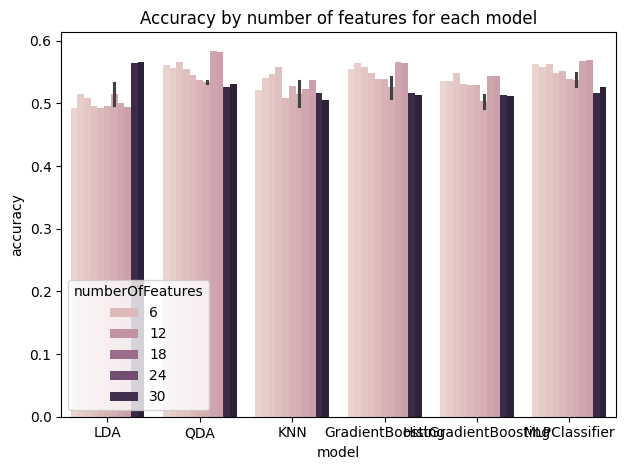

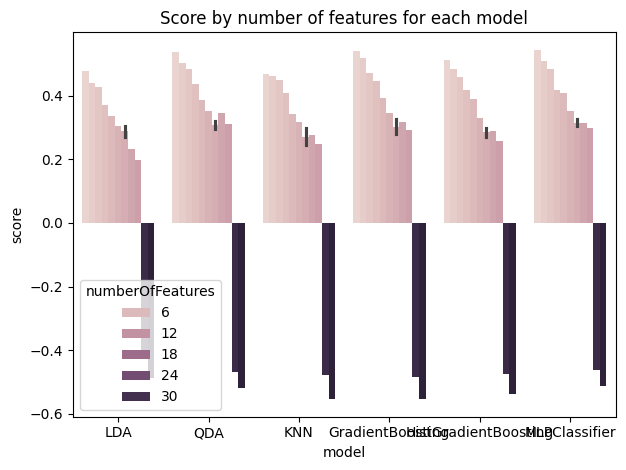

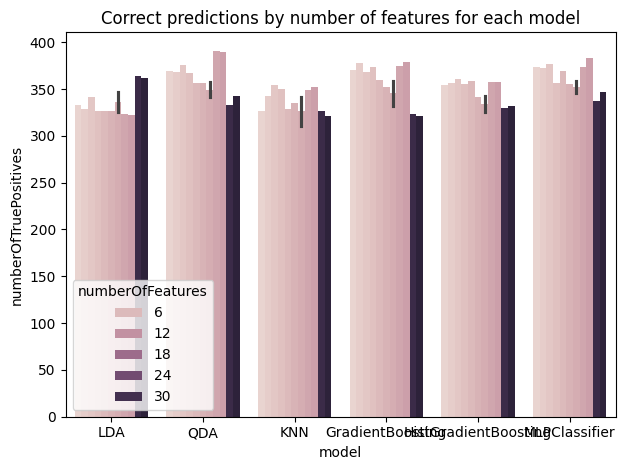

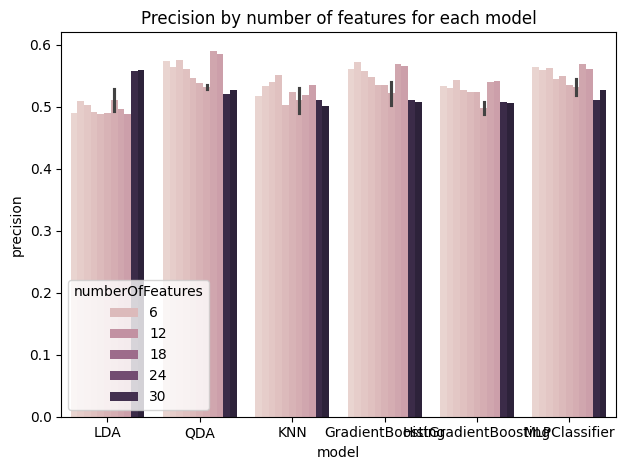

In [41]:
functions.drawResultsPerNumberOfFeatures(processedResultsDf)

### Final Results for Feature Selectors

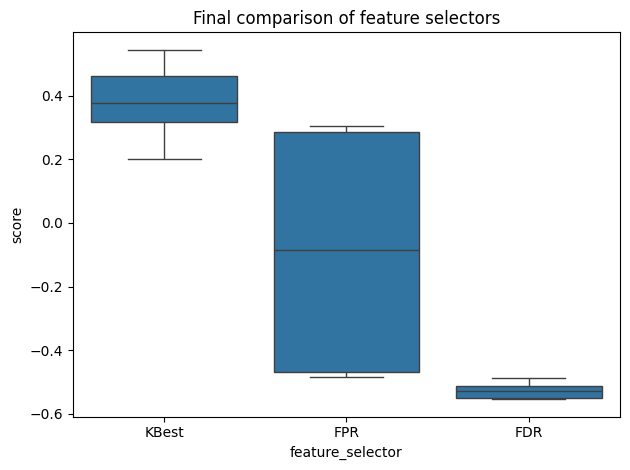

In [42]:
plt.title("Final comparison of feature selectors")
sns.boxplot(data=processedResultsDf, x="feature_selector", y="score")

plt.tight_layout()
plt.show()

### Final Results for Models

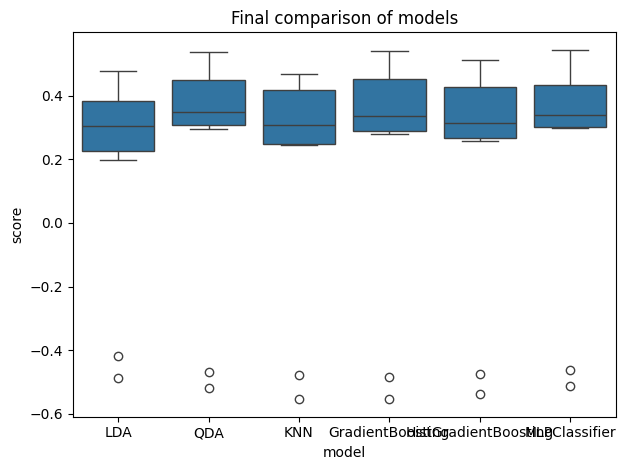

In [43]:
plt.title("Final comparison of models")
sns.boxplot(data=processedResultsDf, x="model", y="score")
plt.tight_layout()
plt.show()

### Final Results

In [44]:
%%time
filteredDf = functions.filterDataframeByBestResults(processedResultsDf)

CPU times: total: 0 ns
Wall time: 1.04 ms


In [45]:
filteredDf

,score,numberOfTruePositives,accuracy,precision,numberOfFeatures,model,model_parameters,feature_selector,selector_parameters,selector_parameters_alpha,selector_parameters_score_func,selector_parameters_k,model_parameters_n_neighbors,model_parameters_solver
5,0.544118,373,0.562424,0.56456,2,MLPClassifier,{},KBest,{'score_func': <function mutual_info_classif a...,<NA>,mutual_info_classif,2,<NA>,<NA>


# Batch 4

## Consts

In [46]:
RESULTS_FILENAME = "./Results/Limited/results-4"

## Experiment

### Parameters

In [47]:
# LDA
solver = ["svd"]
ldaParameters = functions.generateParameters([solver], globals())

# QDA
qdaParameters = [{}]

# KNN
n_neighbors = [5]
knnParameters = functions.generateParameters([n_neighbors], globals())

# SVC
svcParameters = [{}]

# HistGradientBoosting
histGradientBoostingParameters = [{}]


# GradientBoosting
gradientBoostingParameters = [{}]

# MLPClassifier
mlpClassifierParameters = [{}]

# Voting?


models = [
    {"model": functions.ModelType.LDA, "parameters": ldaParameters},
    {"model": functions.ModelType.QDA, "parameters": qdaParameters},
    {"model": functions.ModelType.KNN, "parameters": knnParameters},
    {"model": functions.ModelType.SVC, "parameters": svcParameters},
    {
        "model": functions.ModelType.GradientBoosting,
        "parameters": gradientBoostingParameters,
    },
    {
        "model": functions.ModelType.HistGradientBoosting,
        "parameters": histGradientBoostingParameters,
    },
    {"model": functions.ModelType.MLPClassifier, "parameters": mlpClassifierParameters},
]

In [48]:
# KBest
k = [2, 3, 4]
score_func = [mutual_info_classif]
kBestParameters = functions.generateParameters([score_func, k], globals())

# FPR

# mutual_info_classif seems to break for FPR but maybe try to run these without StandardScaler?
score_func = [f_classif]
alpha = [0.01, 0.05]
fprParameters = functions.generateParameters([score_func, alpha], globals())

# FDR
score_func = [f_classif]
alpha = [0.8]
fdrParameters = functions.generateParameters([score_func, alpha], globals())

# FWE
score_func = [f_classif]
alpha = [0.8]
fweParameters = functions.generateParameters([score_func, alpha], globals())


featureSelectors = [
    {"model": functions.FeatureSelectorType.KBest, "parameters": kBestParameters},
    {"model": functions.FeatureSelectorType.FPR, "parameters": fprParameters},
    {"model": functions.FeatureSelectorType.FDR, "parameters": fdrParameters},
    {"model": functions.FeatureSelectorType.FWE, "parameters": fweParameters},
]

### Conducting the experiment

In [49]:
y_train_ravel = np.ravel(y_train, order="C")
y_train_ravel = y_train_ravel.astype(int)

In [50]:
%%time
results = functions.conductExperiments(
    models=models,
    featureSelectors=featureSelectors,
    X_orig=X_train,
    y_orig=y_train_ravel,
    getLimitedScore=True,
)
with open(RESULTS_FILENAME, "wb") as f:
    pickle.dump(results, f)

Performed Experiment 1/49(approx) took (s): model: 0.01 selector 7.76 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.LDA {'solver': 'svd'}
Performed Experiment 2/49(approx) took (s): model: 0.0 selector 7.76 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.QDA {}
Performed Experiment 3/49(approx) took (s): model: 0.01 selector 7.76 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.SVC {} This 'SVC' has no attribute 'predict_proba'
Performed Experiment 4/49(approx) took (s): model: 0.36 selector 7.76 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.Gra

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 30/49(approx) took (s): model: 4.86 selector 0.18 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.05} ModelType.MLPClassifier {}
Performed Experiment 31/49(approx) took (s): model: 0.01 selector 0.17 with: FeatureSelectorType.FDR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.8} ModelType.LDA {'solver': 'svd'}
Performed Experiment 32/49(approx) took (s): model: 0.01 selector 0.17 with: FeatureSelectorType.FDR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.8} ModelType.QDA {}
Performed Experiment 33/49(approx) took (s): model: 0.02 selector 0.17 with: FeatureSelectorType.FDR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.8} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.FDR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.8} ModelType.SVC {} This 'SVC' has no attribute 'predict_proba'
Performed 

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


## Results

In [51]:
with open(RESULTS_FILENAME, "rb") as input_file:
    results = pickle.load(input_file)

In [52]:
resultsDf = pd.DataFrame(
    results,
    columns=functions.RESULTS_COLUMNS,
)

### Detailed Results

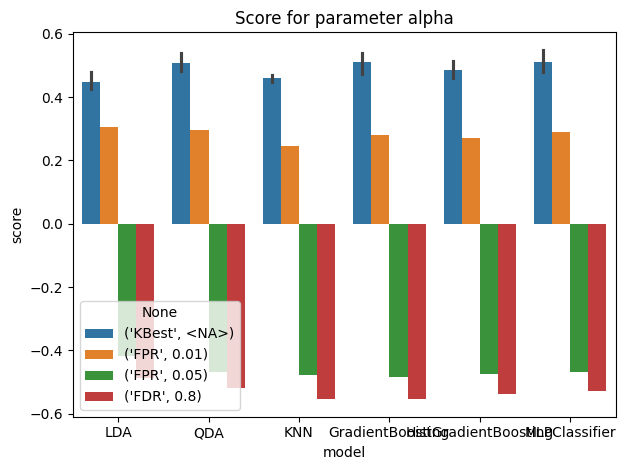

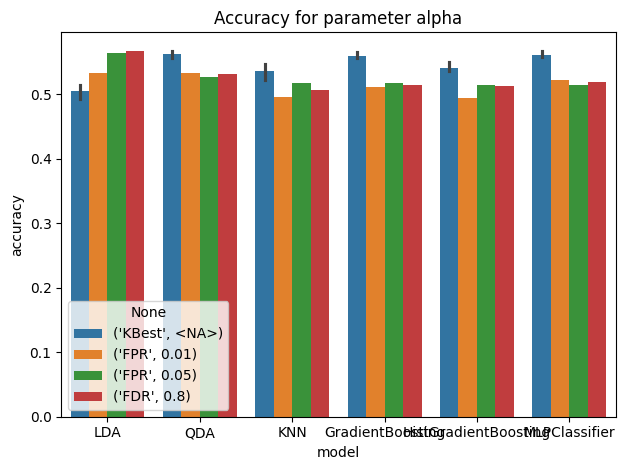

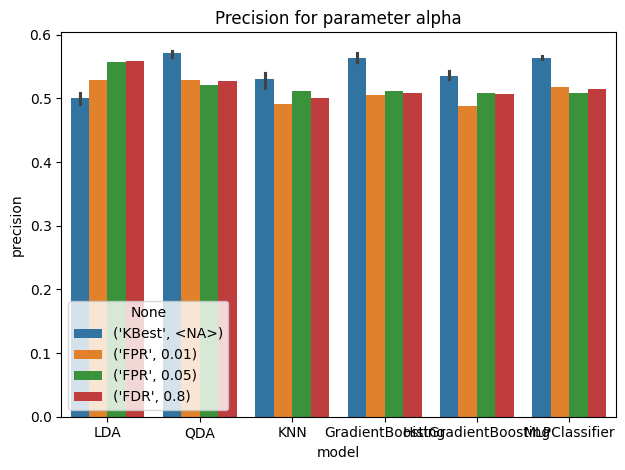

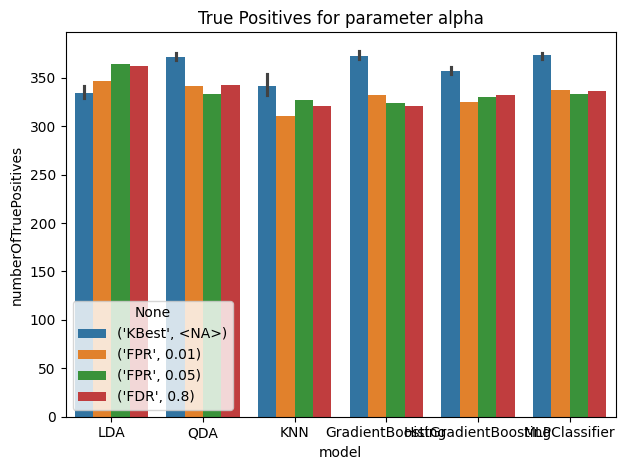

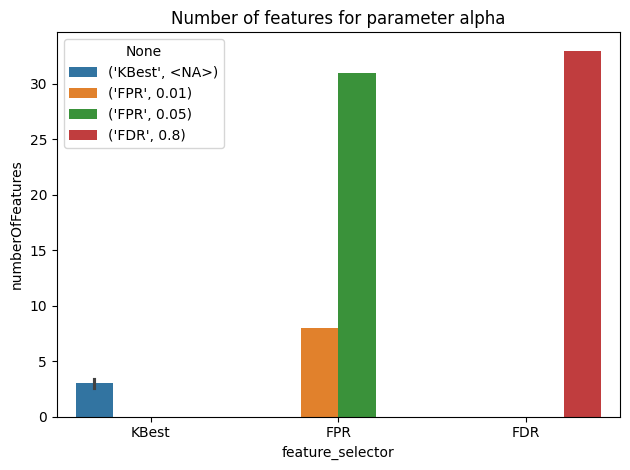

...

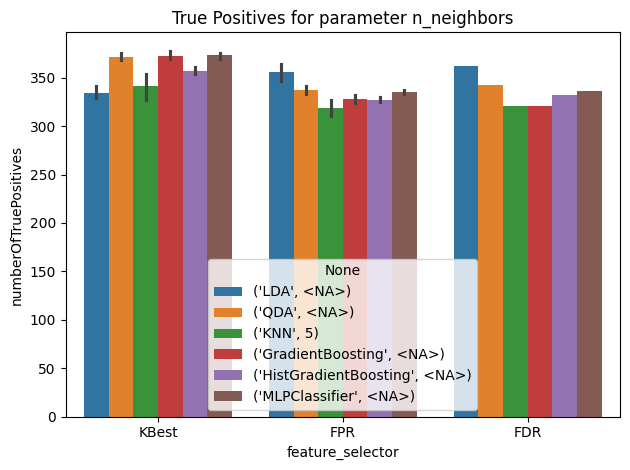

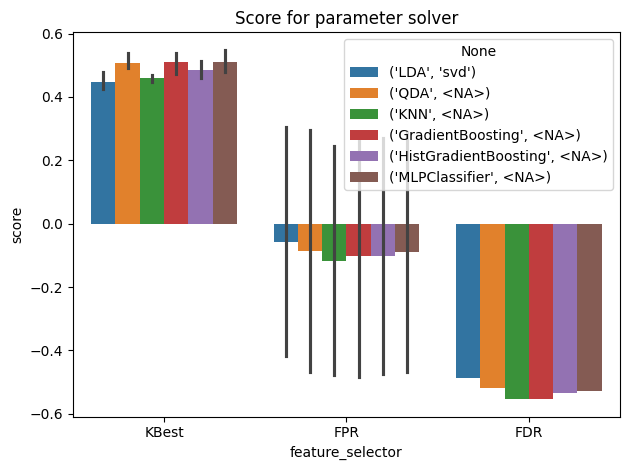

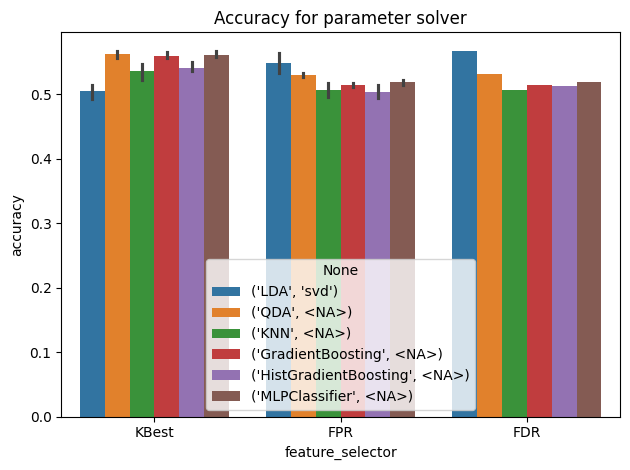

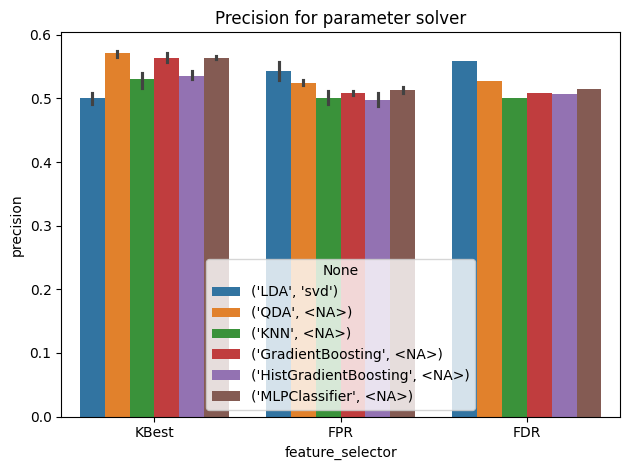

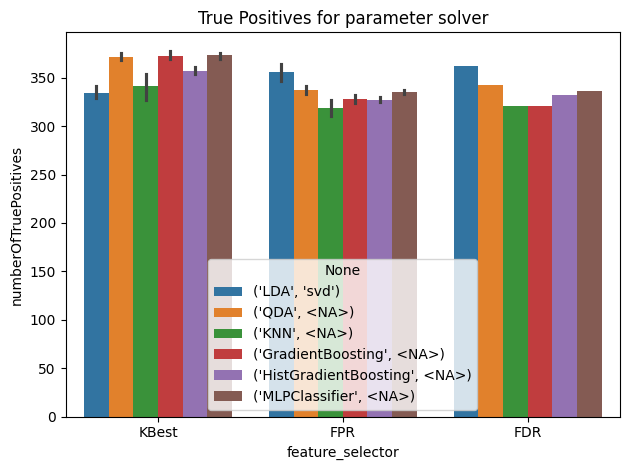

CPU times: total: 3.77 s
Wall time: 8.13 s


In [53]:
%%time
processedResultsDf, parameters = functions.extractParameterResults(
    resultsDf, models, featureSelectors
)
functions.drawParameterResultsBarplot(processedResultsDf, parameters)

### Score/Accuracy by number of features

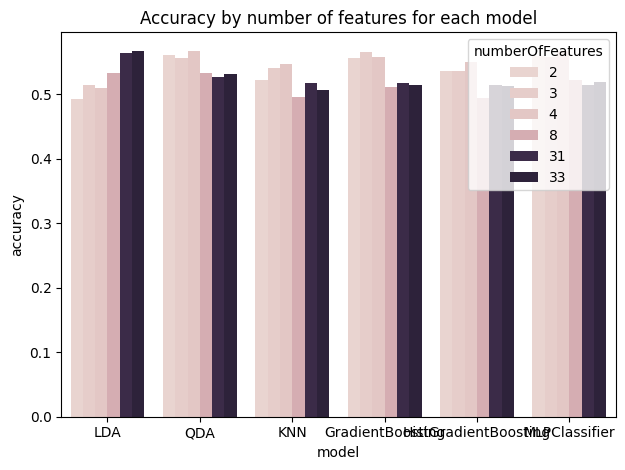

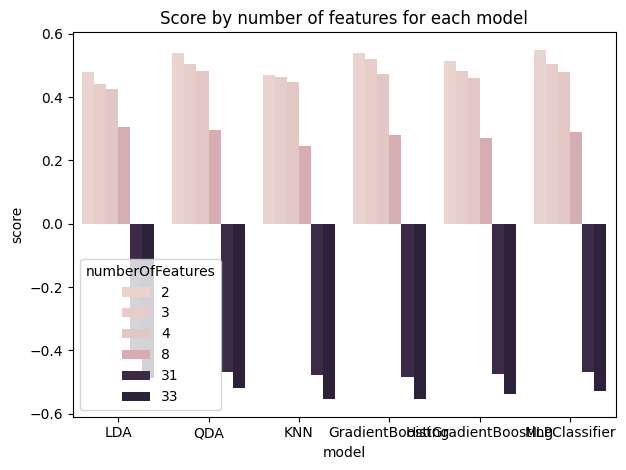

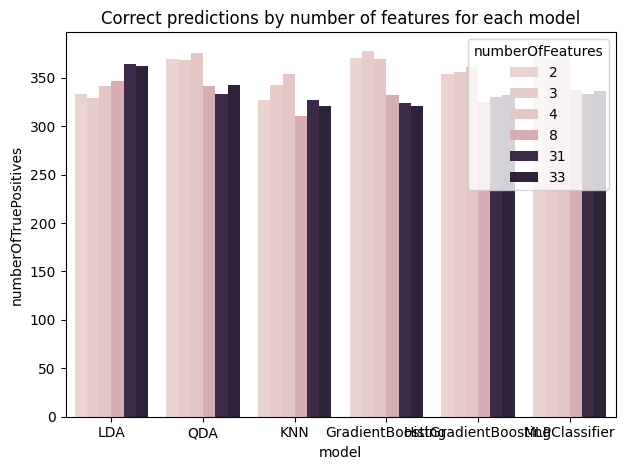

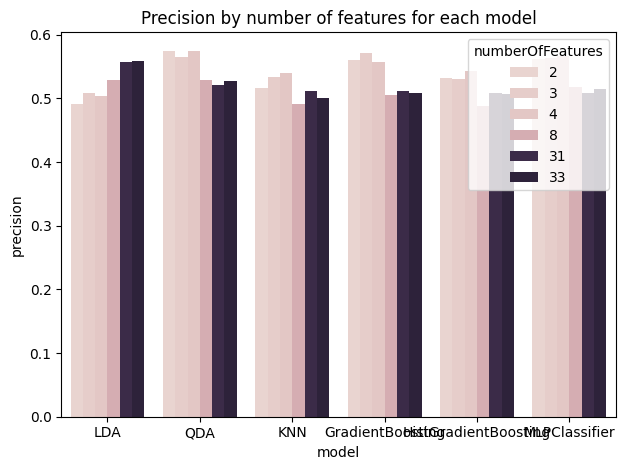

In [54]:
functions.drawResultsPerNumberOfFeatures(processedResultsDf)

### Final Results for Feature Selectors

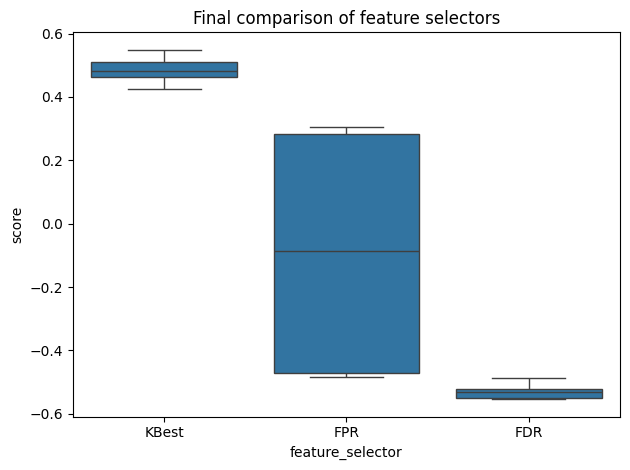

In [55]:
plt.title("Final comparison of feature selectors")
sns.boxplot(data=processedResultsDf, x="feature_selector", y="score")

plt.tight_layout()
plt.show()

### Final Results for Models

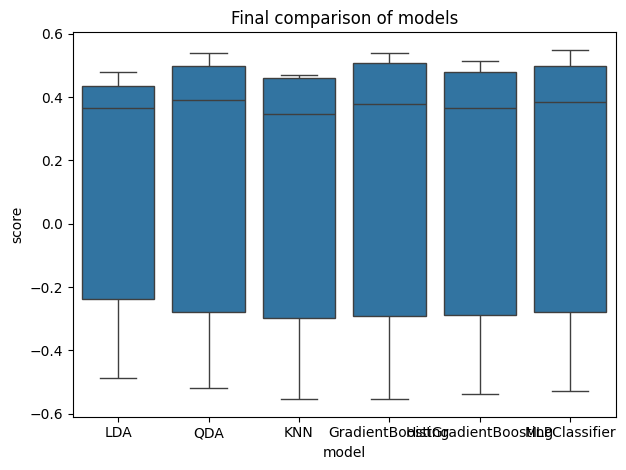

In [56]:
plt.title("Final comparison of models")
sns.boxplot(data=processedResultsDf, x="model", y="score")
plt.tight_layout()
plt.show()

### Final Results

In [57]:
%%time
filteredDf = functions.filterDataframeByBestResults(processedResultsDf)

CPU times: total: 0 ns
Wall time: 1 ms


In [58]:
filteredDf

,score,numberOfTruePositives,accuracy,precision,numberOfFeatures,model,model_parameters,feature_selector,selector_parameters,selector_parameters_alpha,selector_parameters_score_func,selector_parameters_k,model_parameters_n_neighbors,model_parameters_solver
5,0.54902,376,0.558788,0.562323,2,MLPClassifier,{},KBest,{'score_func': <function mutual_info_classif a...,<NA>,mutual_info_classif,2,<NA>,<NA>


# Batch 5

## Consts

In [59]:
RESULTS_FILENAME = "./Results/Limited/results-5"

## Experiment

### Parameters

In [60]:
# LDA
solver = ["svd"]
ldaParameters = functions.generateParameters([solver], globals())

# QDA
qdaParameters = [{}]

# KNN
n_neighbors = [5]
knnParameters = functions.generateParameters([n_neighbors], globals())

# SVC
svcParameters = [{}]

# HistGradientBoosting
histGradientBoostingParameters = [{}]


# GradientBoosting
gradientBoostingParameters = [{}]

# MLPClassifier
mlpClassifierParameters = [{}]

# Voting?


models = [
    {"model": functions.ModelType.LDA, "parameters": ldaParameters},
    {"model": functions.ModelType.QDA, "parameters": qdaParameters},
    {"model": functions.ModelType.KNN, "parameters": knnParameters},
    {"model": functions.ModelType.SVC, "parameters": svcParameters},
    {
        "model": functions.ModelType.GradientBoosting,
        "parameters": gradientBoostingParameters,
    },
    {
        "model": functions.ModelType.HistGradientBoosting,
        "parameters": histGradientBoostingParameters,
    },
    {"model": functions.ModelType.MLPClassifier, "parameters": mlpClassifierParameters},
]

In [61]:
# KBest
k = [2, 3, 4]
score_func = [mutual_info_classif]
kBestParameters = functions.generateParameters([score_func, k], globals())

# FPR

# mutual_info_classif seems to break for FPR but maybe try to run these without StandardScaler?
score_func = [f_classif]
alpha = [0.01, 0.05]
fprParameters = functions.generateParameters([score_func, alpha], globals())


# RFE
estimator = [SVC(kernel="linear")]
n_features_to_select = [5, 10, 20]
step = [0.9]
rfeParameters = functions.generateParameters(
    [estimator, n_features_to_select, step], globals()
)

# RFECV
estimator = [SVC(kernel="linear")]
min_features_to_select = [5, 10, 20]
step = [0.9]
cv = [5]

rfeCvParameters = functions.generateParameters(
    [estimator, min_features_to_select, step, cv], globals()
)


featureSelectors = [
    {"model": functions.FeatureSelectorType.KBest, "parameters": kBestParameters},
    {"model": functions.FeatureSelectorType.FPR, "parameters": fprParameters},
    {"model": functions.FeatureSelectorType.RFE, "parameters": rfeParameters},
    {"model": functions.FeatureSelectorType.RFECV, "parameters": rfeCvParameters},
]

### Conducting the experiment

In [62]:
y_train_ravel = np.ravel(y_train, order="C")
y_train_ravel = y_train_ravel.astype(int)

In [63]:
%%time
results = functions.conductExperiments(
    models=models,
    featureSelectors=featureSelectors,
    X_orig=X_train,
    y_orig=y_train_ravel,
    getLimitedScore=True,
)
with open(RESULTS_FILENAME, "wb") as f:
    pickle.dump(results, f)

Performed Experiment 1/77(approx) took (s): model: 0.0 selector 7.15 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.LDA {'solver': 'svd'}
Performed Experiment 2/77(approx) took (s): model: 0.0 selector 7.15 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.QDA {}
Performed Experiment 3/77(approx) took (s): model: 0.01 selector 7.15 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.SVC {} This 'SVC' has no attribute 'predict_proba'
Performed Experiment 4/77(approx) took (s): model: 0.3 selector 7.15 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x000001A9D13ECC20>, 'k': 2} ModelType.Gradi

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 30/77(approx) took (s): model: 4.05 selector 0.17 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x000001A9D13EE8E0>, 'alpha': 0.05} ModelType.MLPClassifier {}
Performed Experiment 31/77(approx) took (s): model: 0.02 selector 293.42 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.LDA {'solver': 'svd'}
Performed Experiment 32/77(approx) took (s): model: 0.0 selector 293.42 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.QDA {}
Performed Experiment 33/77(approx) took (s): model: 0.02 selector 293.42 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.SVC {} This 'SVC' has no attribute 'predict_

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 42/77(approx) took (s): model: 2.55 selector 353.85 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 10, 'step': 0.9} ModelType.MLPClassifier {}
Performed Experiment 43/77(approx) took (s): model: 0.0 selector 306.16 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 20, 'step': 0.9} ModelType.LDA {'solver': 'svd'}
Performed Experiment 44/77(approx) took (s): model: 0.01 selector 306.16 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 20, 'step': 0.9} ModelType.QDA {}
Performed Experiment 45/77(approx) took (s): model: 0.01 selector 306.16 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 20, 'step': 0.9} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 20, 'step': 0.9} ModelType.SVC {} This 'SVC' has no attribute 

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 48/77(approx) took (s): model: 4.38 selector 306.16 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 20, 'step': 0.9} ModelType.MLPClassifier {}
Performed Experiment 49/77(approx) took (s): model: 0.67 selector 1406.52 with: FeatureSelectorType.RFECV {'estimator': SVC(kernel='linear'), 'min_features_to_select': 5, 'step': 0.9, 'cv': 5} ModelType.LDA {'solver': 'svd'}
Performed Experiment 50/77(approx) took (s): model: 0.04 selector 1406.52 with: FeatureSelectorType.RFECV {'estimator': SVC(kernel='linear'), 'min_features_to_select': 5, 'step': 0.9, 'cv': 5} ModelType.QDA {}
Performed Experiment 51/77(approx) took (s): model: 0.02 selector 1406.52 with: FeatureSelectorType.RFECV {'estimator': SVC(kernel='linear'), 'min_features_to_select': 5, 'step': 0.9, 'cv': 5} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.RFECV {'estimator': SVC(kernel='linear'), 'min_features_to_select': 5, 'step': 0.9, 'c

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 54/77(approx) took (s): model: 4.96 selector 1406.52 with: FeatureSelectorType.RFECV {'estimator': SVC(kernel='linear'), 'min_features_to_select': 5, 'step': 0.9, 'cv': 5} ModelType.MLPClassifier {}
Performed Experiment 55/77(approx) took (s): model: 3.18 selector 1992.18 with: FeatureSelectorType.RFECV {'estimator': SVC(kernel='linear'), 'min_features_to_select': 10, 'step': 0.9, 'cv': 5} ModelType.LDA {'solver': 'svd'}
Performed Experiment 56/77(approx) took (s): model: 0.04 selector 1992.18 with: FeatureSelectorType.RFECV {'estimator': SVC(kernel='linear'), 'min_features_to_select': 10, 'step': 0.9, 'cv': 5} ModelType.QDA {}
Performed Experiment 57/77(approx) took (s): model: 0.03 selector 1992.18 with: FeatureSelectorType.RFECV {'estimator': SVC(kernel='linear'), 'min_features_to_select': 10, 'step': 0.9, 'cv': 5} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.RFECV {'estimator': SVC(kernel='linear'), 'min_features_to_select': 10

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 60/77(approx) took (s): model: 13.58 selector 1992.18 with: FeatureSelectorType.RFECV {'estimator': SVC(kernel='linear'), 'min_features_to_select': 10, 'step': 0.9, 'cv': 5} ModelType.MLPClassifier {}
Performed Experiment 61/77(approx) took (s): model: 0.68 selector 2395.68 with: FeatureSelectorType.RFECV {'estimator': SVC(kernel='linear'), 'min_features_to_select': 20, 'step': 0.9, 'cv': 5} ModelType.LDA {'solver': 'svd'}
Performed Experiment 62/77(approx) took (s): model: 0.01 selector 2395.68 with: FeatureSelectorType.RFECV {'estimator': SVC(kernel='linear'), 'min_features_to_select': 20, 'step': 0.9, 'cv': 5} ModelType.QDA {}
Performed Experiment 63/77(approx) took (s): model: 0.02 selector 2395.68 with: FeatureSelectorType.RFECV {'estimator': SVC(kernel='linear'), 'min_features_to_select': 20, 'step': 0.9, 'cv': 5} ModelType.KNN {'n_neighbors': 5}
!!!Experiment failed for: FeatureSelectorType.RFECV {'estimator': SVC(kernel='linear'), 'min_features_to_select': 

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


## Results

In [64]:
with open(RESULTS_FILENAME, "rb") as input_file:
    results = pickle.load(input_file)

In [65]:
resultsDf = pd.DataFrame(
    results,
    columns=functions.RESULTS_COLUMNS,
)

### Detailed Results

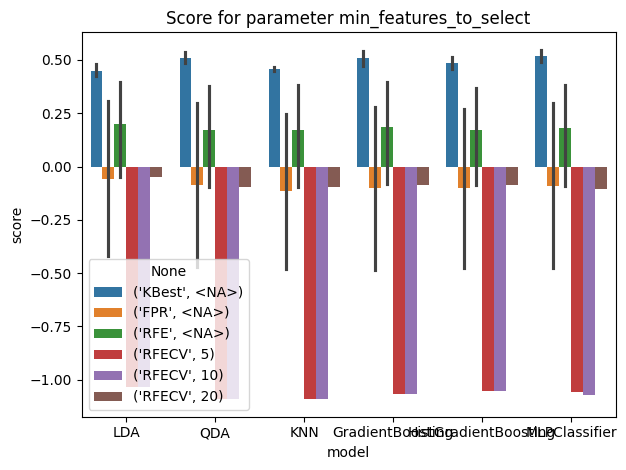

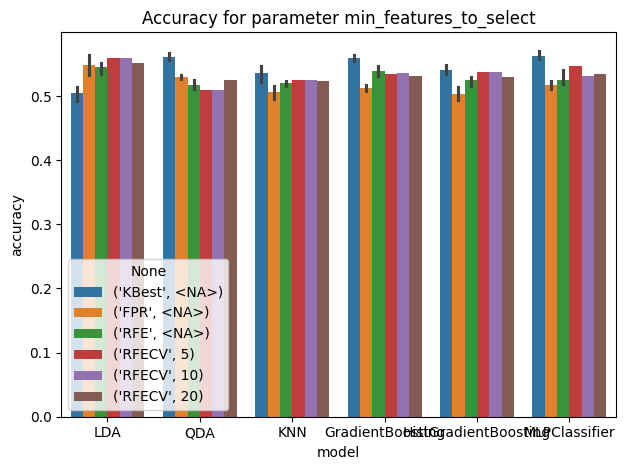

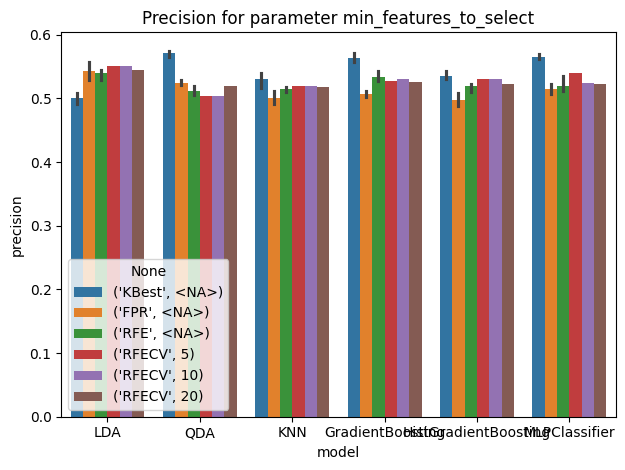

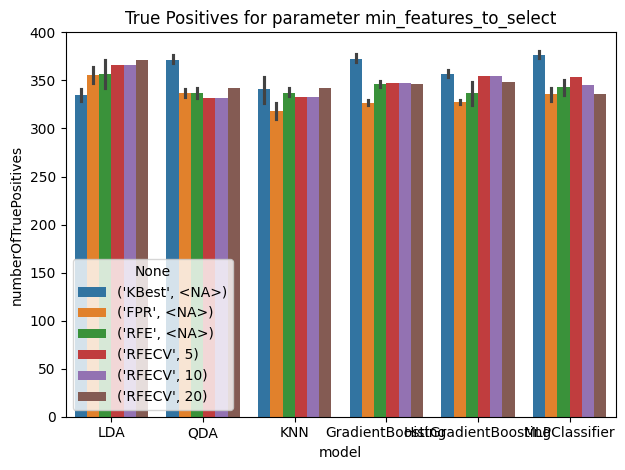

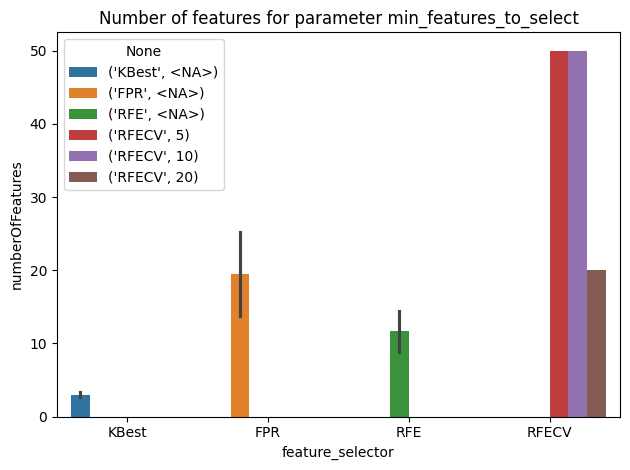

...

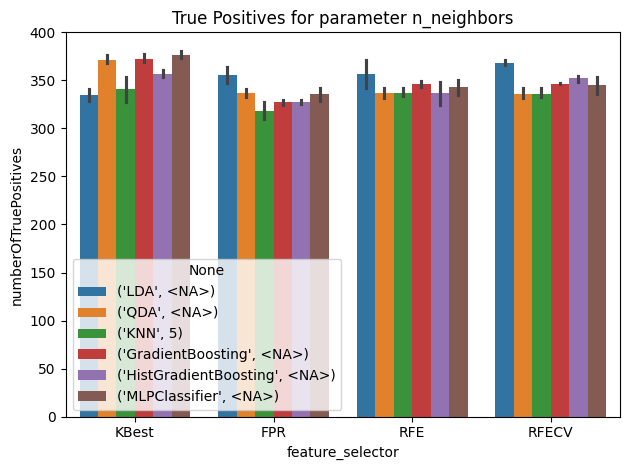

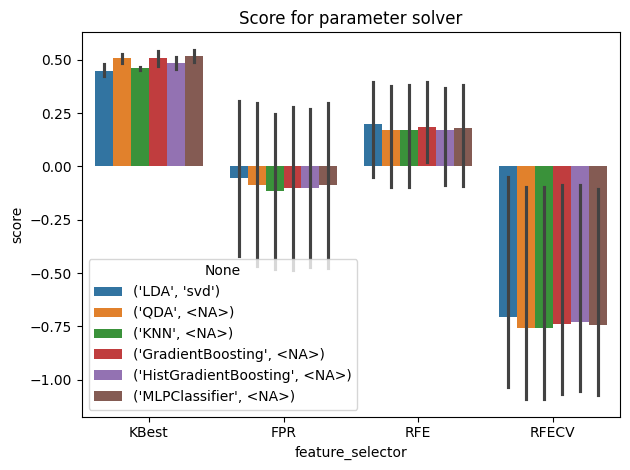

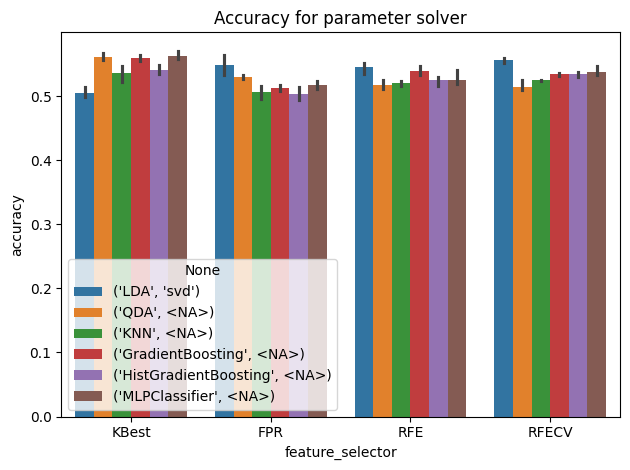

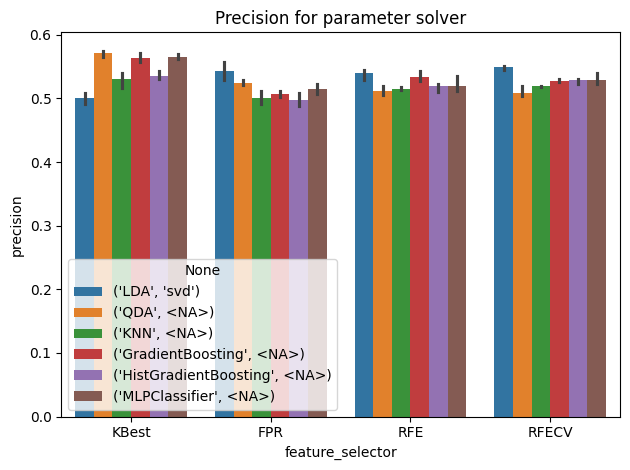

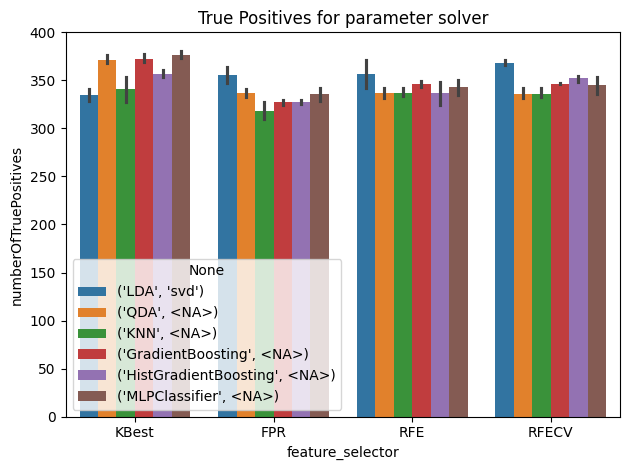

CPU times: total: 54 s
Wall time: 59.1 s


In [66]:
%%time
processedResultsDf, parameters = functions.extractParameterResults(
    resultsDf, models, featureSelectors
)
functions.drawParameterResultsBarplot(processedResultsDf, parameters)

### Score/Accuracy by number of features

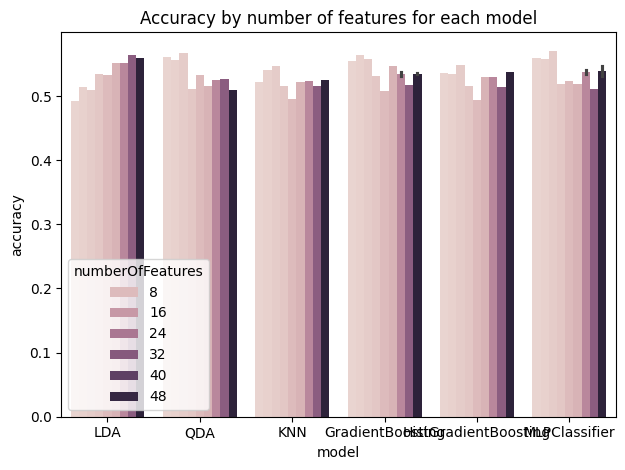

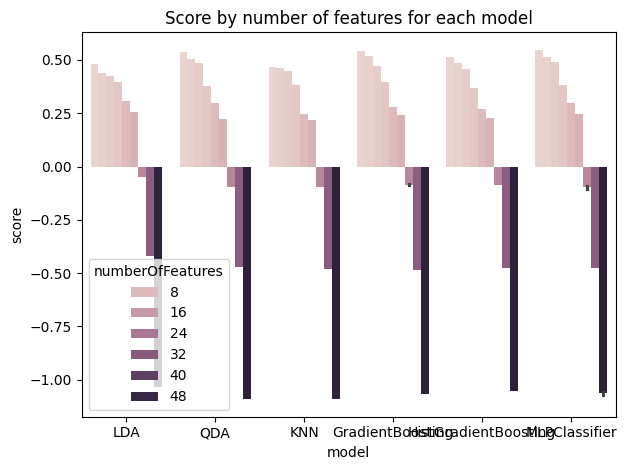

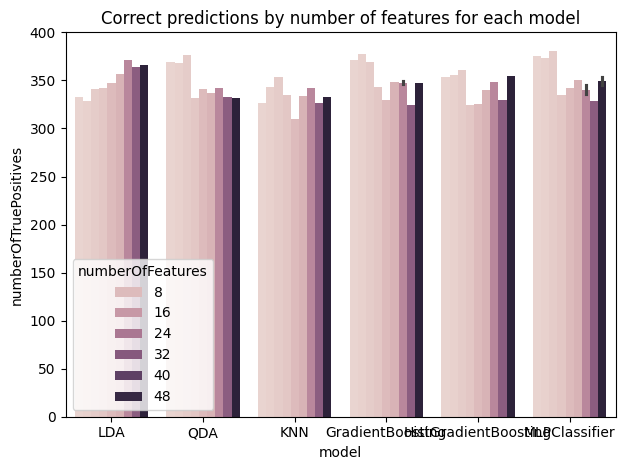

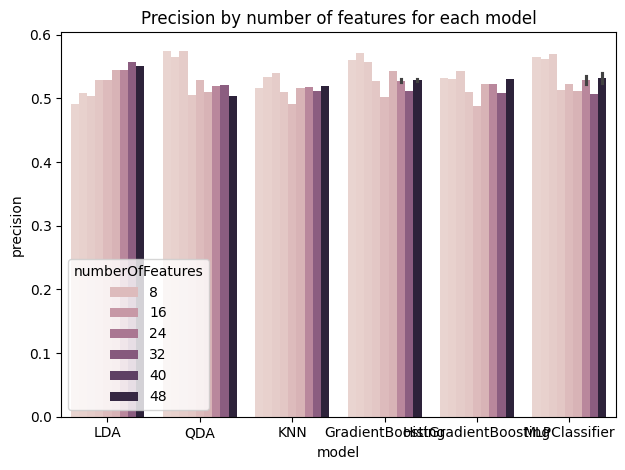

In [67]:
functions.drawResultsPerNumberOfFeatures(processedResultsDf)

### Final Results for Feature Selectors

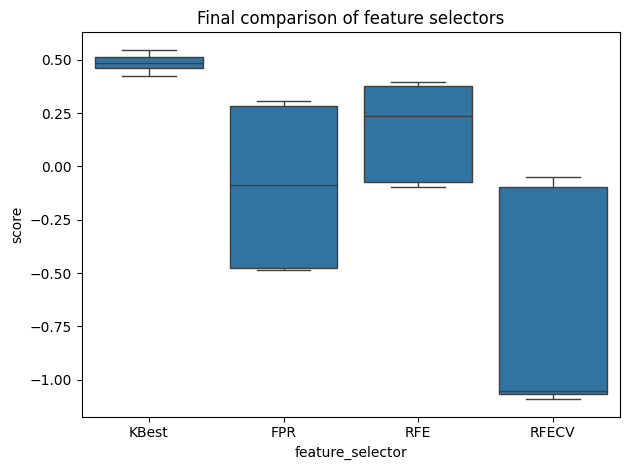

In [68]:
plt.title("Final comparison of feature selectors")
sns.boxplot(data=processedResultsDf, x="feature_selector", y="score")

plt.tight_layout()
plt.show()

### Final Results for Models

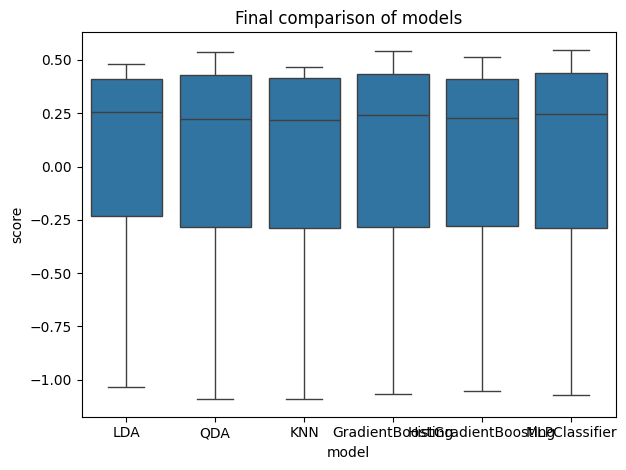

In [69]:
plt.title("Final comparison of models")
sns.boxplot(data=processedResultsDf, x="model", y="score")

plt.tight_layout()
plt.show()

### Final Results

In [70]:
%%time
filteredDf = functions.filterDataframeByBestResults(processedResultsDf)

CPU times: total: 0 ns
Wall time: 1 ms


In [71]:
filteredDf

,score,numberOfTruePositives,accuracy,precision,numberOfFeatures,model,model_parameters,feature_selector,selector_parameters,selector_parameters_min_features_to_select,selector_parameters_n_features_to_select,selector_parameters_estimator,selector_parameters_step,selector_parameters_k,selector_parameters_alpha,selector_parameters_score_func,selector_parameters_cv,model_parameters_n_neighbors,model_parameters_solver
5,0.547386,375,0.56,0.565029,2,MLPClassifier,{},KBest,{'score_func': <function mutual_info_classif a...,<NA>,<NA>,<NA>,<NA>,2,<NA>,mutual_info_classif,<NA>,<NA>,<NA>


# Batch 6

## Consts

In [4]:
RESULTS_FILENAME = "./Results/Limited/results-6"

## Experiment

### Parameters

In [5]:
# HistGradientBoostingClassifier
learning_rate = [0.1, 0.01]
max_depth = [2, 3, 5, None]
random_state = [42]
max_features = [3, 5, 8, 1.0]
l2_regularization = [0, 0.5, 0.8]
histGradientBoostingParameters = functions.generateParameters(
    [learning_rate, max_depth, random_state, max_features, l2_regularization], globals()
)

# LDA
solver = ["svd", "lsqr"]
shrinkage = [None, "auto"]
n_components = [3, 5, 8, None]
ldaParameters = functions.generateParameters(
    [solver, shrinkage, n_components], globals()
)


# QDA
reg_param = [0, 0.3, 0.5, 0.8]
qdaParameters = functions.generateParameters([reg_param], globals())

# KNN
n_neighbors = [3, 5, 8]
weights = ["uniform", "distance"]
p = [1, 2]
leaf_size = [15, 30, 50]
knnParameters = functions.generateParameters(
    [n_neighbors, weights, p, leaf_size], globals()
)

# SVM
C = [0.5, 1.0, 1.5]
kernel = ["linear", "rbf", "sigmoid", "poly"]
svcParameters = functions.generateParameters([C, kernel], globals())

# GradientBoostingClassifier
loss = ["log_loss", "exponential"]
learning_rate = [0.1, 0.01]
n_estimators = [100, 200]
subsample = [1.0, 0.7]
max_depth = [2, 3, 5]
random_state = [42]
max_features = [3, 5, 8, None]
ccp_alpha = [0, 0.01, 0.05, 0.1]
gradientBoostingParameters = functions.generateParameters(
    [
        loss,
        learning_rate,
        n_estimators,
        subsample,
        max_depth,
        random_state,
        max_features,
        ccp_alpha,
    ],
    globals(),
)


# MLPClassifier


activation = ["identity", "logistic", "tanh", "relu"]
solver = ["lbfgs", "sgd", "adam"]
alpha = [0.001, 0.01, 0.0001]
learning_rate = ["constant", "invscaling", "adaptive"]
learning_rate_init = [0.001, 0.0001, 0.01]
max_iter = [800]
random_state = [42]
mlpClassifierParameters = functions.generateParameters(
    [
        activation,
        solver,
        alpha,
        learning_rate,
        learning_rate_init,
        max_iter,
        random_state,
    ],
    globals(),
)
# Voting?


models = [
    {"model": functions.ModelType.LDA, "parameters": ldaParameters},
    {"model": functions.ModelType.QDA, "parameters": qdaParameters},
    {"model": functions.ModelType.KNN, "parameters": knnParameters},
    {"model": functions.ModelType.SVC, "parameters": svcParameters},
    {
        "model": functions.ModelType.GradientBoosting,
        "parameters": gradientBoostingParameters,
    },
    {
        "model": functions.ModelType.HistGradientBoosting,
        "parameters": histGradientBoostingParameters,
    },
    {"model": functions.ModelType.MLPClassifier, "parameters": mlpClassifierParameters},
]

In [6]:
# KBest
k = [2, 3, 4, 10, 20]
score_func = [mutual_info_classif]
kBestParameters = functions.generateParameters([score_func, k], globals())

# FPR

# mutual_info_classif seems to break for FPR but maybe try to run these without StandardScaler?
score_func = [f_classif]
alpha = [0.01]
fprParameters = functions.generateParameters([score_func, alpha], globals())


# RFE
estimator = [SVC(kernel="linear")]
n_features_to_select = [2,5]
step = [0.9]
rfeParameters = functions.generateParameters(
    [estimator, n_features_to_select, step], globals()
)


featureSelectors = [
    {"model": functions.FeatureSelectorType.KBest, "parameters": kBestParameters},
    {"model": functions.FeatureSelectorType.FPR, "parameters": fprParameters},
    {"model": functions.FeatureSelectorType.RFE, "parameters": rfeParameters},
]

### Conducting the experiment

In [7]:
y_train_ravel = np.ravel(y_train, order="C")
y_train_ravel = y_train_ravel.astype(int)

In [8]:
%%time
results = functions.conductExperiments(
    models=models,
    featureSelectors=featureSelectors,
    X_orig=X_train,
    y_orig=y_train_ravel,
)
with open(RESULTS_FILENAME, "wb") as f:
    pickle.dump(results, f)

!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.LDA {'solver': 'svd', 'shrinkage': None, 'n_components': 3} n_components cannot be larger than min(n_features, n_classes - 1).
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.LDA {'solver': 'svd', 'shrinkage': None, 'n_components': 5} n_components cannot be larger than min(n_features, n_classes - 1).
!!!Experiment failed for: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.LDA {'solver': 'svd', 'shrinkage': None, 'n_components': 8} n_components cannot be larger than min(n_features, n_classes - 1).
Performed Experiment 1/10048(approx) took (s): model: 0.0 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.LDA {'solve

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 960/10048(approx) took (s): model: 0.54 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 961/10048(approx) took (s): model: 0.45 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 962/10048(approx) took (s): model: 2.5 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'le

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 969/10048(approx) took (s): model: 0.62 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 970/10048(approx) took (s): model: 0.63 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 971/10048(approx) took (s): model: 2.76 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.01, 'lear

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 978/10048(approx) took (s): model: 0.98 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 979/10048(approx) took (s): model: 0.79 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 980/10048(approx) took (s): model: 4.78 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0001,

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1010/10048(approx) took (s): model: 8.51 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1011/10048(approx) took (s): model: 9.03 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1012/10048(approx) took (s): model: 8.98 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1013/10048(approx) took (s): model: 8.8 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1014/10048(approx) took (s): model: 9.05 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1015/10048(approx) took (s): model: 9.16 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1016/10048(approx) took (s): model: 8.65 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1017/10048(approx) took (s): model: 9.03 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1018/10048(approx) took (s): model: 9.04 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1019/10048(approx) took (s): model: 8.57 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1020/10048(approx) took (s): model: 8.91 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1021/10048(approx) took (s): model: 9.24 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1022/10048(approx) took (s): model: 8.89 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1023/10048(approx) took (s): model: 8.57 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1024/10048(approx) took (s): model: 8.72 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1025/10048(approx) took (s): model: 8.77 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1026/10048(approx) took (s): model: 9.72 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1027/10048(approx) took (s): model: 8.26 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1028/10048(approx) took (s): model: 7.79 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1029/10048(approx) took (s): model: 7.44 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1030/10048(approx) took (s): model: 7.43 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1031/10048(approx) took (s): model: 7.59 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1032/10048(approx) took (s): model: 7.62 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1033/10048(approx) took (s): model: 8.04 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1034/10048(approx) took (s): model: 7.88 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1035/10048(approx) took (s): model: 7.83 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1036/10048(approx) took (s): model: 7.82 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 1037/10048(approx) took (s): model: 0.39 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 1038/10048(approx) took (s): model: 1.49 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_rat

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1091/10048(approx) took (s): model: 5.81 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1092/10048(approx) took (s): model: 5.91 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1093/10048(approx) took (s): model: 6.05 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1094/10048(approx) took (s): model: 5.91 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1095/10048(approx) took (s): model: 5.87 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1096/10048(approx) took (s): model: 5.85 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1097/10048(approx) took (s): model: 5.76 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1098/10048(approx) took (s): model: 6.1 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1099/10048(approx) took (s): model: 6.52 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1100/10048(approx) took (s): model: 6.32 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1101/10048(approx) took (s): model: 5.87 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1102/10048(approx) took (s): model: 5.86 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1103/10048(approx) took (s): model: 5.97 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1104/10048(approx) took (s): model: 6.09 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1105/10048(approx) took (s): model: 5.95 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1106/10048(approx) took (s): model: 5.75 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1107/10048(approx) took (s): model: 5.84 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1108/10048(approx) took (s): model: 5.94 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1109/10048(approx) took (s): model: 5.97 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1110/10048(approx) took (s): model: 6.12 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1111/10048(approx) took (s): model: 6.33 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1112/10048(approx) took (s): model: 6.36 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1113/10048(approx) took (s): model: 6.43 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1114/10048(approx) took (s): model: 6.38 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1115/10048(approx) took (s): model: 6.42 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1116/10048(approx) took (s): model: 6.32 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 1117/10048(approx) took (s): model: 6.38 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 1118/10048(approx) took (s): model: 0.92 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 1119/10048(approx) took (s): model: 1.26 selector 8.05 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 2} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rat

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 2156/10048(approx) took (s): model: 0.68 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2157/10048(approx) took (s): model: 0.5 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2158/10048(approx) took (s): model: 0.65 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001, 

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 2159/10048(approx) took (s): model: 0.69 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2160/10048(approx) took (s): model: 0.53 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2161/10048(approx) took (s): model: 0.73 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001,

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 2162/10048(approx) took (s): model: 0.8 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2163/10048(approx) took (s): model: 0.64 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2164/10048(approx) took (s): model: 1.19 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'lea

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 2165/10048(approx) took (s): model: 0.85 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2166/10048(approx) took (s): model: 0.6 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2167/10048(approx) took (s): model: 0.55 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'le

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 2168/10048(approx) took (s): model: 0.64 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2169/10048(approx) took (s): model: 0.61 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2170/10048(approx) took (s): model: 0.75 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'l

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 2171/10048(approx) took (s): model: 0.75 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2172/10048(approx) took (s): model: 0.86 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2173/10048(approx) took (s): model: 0.93 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0001, 

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 2174/10048(approx) took (s): model: 0.68 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2175/10048(approx) took (s): model: 0.94 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2176/10048(approx) took (s): model: 0.78 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.00

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 2177/10048(approx) took (s): model: 0.78 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2178/10048(approx) took (s): model: 0.62 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2179/10048(approx) took (s): model: 0.71 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.00

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 2180/10048(approx) took (s): model: 0.73 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2181/10048(approx) took (s): model: 7.73 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2182/10048(approx) took (s): model: 7.89 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2183/10048(approx) took (s): model: 7.88 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2184/10048(approx) took (s): model: 7.62 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2185/10048(approx) took (s): model: 7.48 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2186/10048(approx) took (s): model: 7.66 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2187/10048(approx) took (s): model: 8.09 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2188/10048(approx) took (s): model: 7.53 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2189/10048(approx) took (s): model: 7.61 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2190/10048(approx) took (s): model: 8.52 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2191/10048(approx) took (s): model: 7.87 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2192/10048(approx) took (s): model: 7.56 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2193/10048(approx) took (s): model: 7.73 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2194/10048(approx) took (s): model: 7.4 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2195/10048(approx) took (s): model: 8.5 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2196/10048(approx) took (s): model: 7.82 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2197/10048(approx) took (s): model: 8.11 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2198/10048(approx) took (s): model: 8.79 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2199/10048(approx) took (s): model: 7.94 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2200/10048(approx) took (s): model: 8.18 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2201/10048(approx) took (s): model: 7.74 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2202/10048(approx) took (s): model: 8.54 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2203/10048(approx) took (s): model: 7.36 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2204/10048(approx) took (s): model: 7.81 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2205/10048(approx) took (s): model: 7.26 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2206/10048(approx) took (s): model: 7.29 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2207/10048(approx) took (s): model: 7.45 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2208/10048(approx) took (s): model: 0.35 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2209/10048(approx) took (s): model: 1.05 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_rat

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2262/10048(approx) took (s): model: 6.35 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2263/10048(approx) took (s): model: 6.29 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2264/10048(approx) took (s): model: 6.06 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2265/10048(approx) took (s): model: 5.85 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2266/10048(approx) took (s): model: 5.98 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2267/10048(approx) took (s): model: 6.09 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2268/10048(approx) took (s): model: 5.97 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2269/10048(approx) took (s): model: 5.88 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2270/10048(approx) took (s): model: 5.92 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2271/10048(approx) took (s): model: 5.85 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2272/10048(approx) took (s): model: 5.92 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2273/10048(approx) took (s): model: 6.06 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2274/10048(approx) took (s): model: 5.8 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2275/10048(approx) took (s): model: 6.3 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2276/10048(approx) took (s): model: 6.3 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2277/10048(approx) took (s): model: 6.0 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2278/10048(approx) took (s): model: 6.26 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2279/10048(approx) took (s): model: 6.12 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2280/10048(approx) took (s): model: 5.97 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2281/10048(approx) took (s): model: 6.22 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2282/10048(approx) took (s): model: 7.63 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2283/10048(approx) took (s): model: 6.8 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2284/10048(approx) took (s): model: 6.77 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2285/10048(approx) took (s): model: 6.39 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2286/10048(approx) took (s): model: 6.45 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2287/10048(approx) took (s): model: 6.67 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 2288/10048(approx) took (s): model: 6.44 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2289/10048(approx) took (s): model: 1.09 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 2290/10048(approx) took (s): model: 0.94 selector 7.45 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 3} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rat

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3352/10048(approx) took (s): model: 7.46 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3353/10048(approx) took (s): model: 7.55 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3354/10048(approx) took (s): model: 7.42 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3355/10048(approx) took (s): model: 7.48 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3356/10048(approx) took (s): model: 7.3 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3357/10048(approx) took (s): model: 7.59 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3358/10048(approx) took (s): model: 7.53 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3359/10048(approx) took (s): model: 7.33 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3360/10048(approx) took (s): model: 7.89 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3361/10048(approx) took (s): model: 7.49 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3362/10048(approx) took (s): model: 7.47 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3363/10048(approx) took (s): model: 7.4 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3364/10048(approx) took (s): model: 7.71 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3365/10048(approx) took (s): model: 7.92 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3366/10048(approx) took (s): model: 7.63 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3367/10048(approx) took (s): model: 7.42 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3368/10048(approx) took (s): model: 8.18 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3369/10048(approx) took (s): model: 7.64 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3370/10048(approx) took (s): model: 7.65 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3371/10048(approx) took (s): model: 7.49 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3372/10048(approx) took (s): model: 7.53 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3373/10048(approx) took (s): model: 7.58 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3374/10048(approx) took (s): model: 7.9 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3375/10048(approx) took (s): model: 7.82 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3376/10048(approx) took (s): model: 8.0 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3377/10048(approx) took (s): model: 7.52 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3378/10048(approx) took (s): model: 7.29 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 3379/10048(approx) took (s): model: 0.89 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 3380/10048(approx) took (s): model: 1.62 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_rat

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3433/10048(approx) took (s): model: 5.92 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3434/10048(approx) took (s): model: 6.21 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3435/10048(approx) took (s): model: 6.1 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3436/10048(approx) took (s): model: 6.02 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3437/10048(approx) took (s): model: 6.21 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3438/10048(approx) took (s): model: 6.22 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3439/10048(approx) took (s): model: 6.1 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3440/10048(approx) took (s): model: 6.32 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3441/10048(approx) took (s): model: 6.38 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3442/10048(approx) took (s): model: 6.34 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3443/10048(approx) took (s): model: 6.36 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3444/10048(approx) took (s): model: 6.45 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3445/10048(approx) took (s): model: 6.64 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3446/10048(approx) took (s): model: 6.68 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3447/10048(approx) took (s): model: 6.48 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3448/10048(approx) took (s): model: 6.45 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3449/10048(approx) took (s): model: 6.47 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3450/10048(approx) took (s): model: 6.69 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3451/10048(approx) took (s): model: 6.57 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3452/10048(approx) took (s): model: 6.47 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3453/10048(approx) took (s): model: 6.4 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3454/10048(approx) took (s): model: 7.13 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3455/10048(approx) took (s): model: 6.42 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3456/10048(approx) took (s): model: 7.04 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3457/10048(approx) took (s): model: 6.37 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3458/10048(approx) took (s): model: 6.42 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 3459/10048(approx) took (s): model: 6.43 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 3460/10048(approx) took (s): model: 1.04 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 3461/10048(approx) took (s): model: 1.68 selector 7.19 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 4} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rat

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4442/10048(approx) took (s): model: 17.66 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4443/10048(approx) took (s): model: 17.65 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4444/10048(approx) took (s): model: 18.01 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4445/10048(approx) took (s): model: 18.21 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4446/10048(approx) took (s): model: 17.41 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4447/10048(approx) took (s): model: 17.53 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4448/10048(approx) took (s): model: 17.4 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4449/10048(approx) took (s): model: 17.85 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4450/10048(approx) took (s): model: 18.45 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4451/10048(approx) took (s): model: 17.44 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4452/10048(approx) took (s): model: 17.61 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4453/10048(approx) took (s): model: 18.27 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4454/10048(approx) took (s): model: 17.36 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4455/10048(approx) took (s): model: 17.9 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4456/10048(approx) took (s): model: 19.93 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4457/10048(approx) took (s): model: 18.31 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4458/10048(approx) took (s): model: 17.67 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4459/10048(approx) took (s): model: 17.76 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4460/10048(approx) took (s): model: 17.6 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4461/10048(approx) took (s): model: 18.0 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4462/10048(approx) took (s): model: 17.81 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4463/10048(approx) took (s): model: 17.95 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4464/10048(approx) took (s): model: 18.18 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4465/10048(approx) took (s): model: 17.48 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4466/10048(approx) took (s): model: 19.57 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4467/10048(approx) took (s): model: 18.85 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4468/10048(approx) took (s): model: 17.66 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4469/10048(approx) took (s): model: 0.73 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4470/10048(approx) took (s): model: 1.33 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.00

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4523/10048(approx) took (s): model: 8.19 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4524/10048(approx) took (s): model: 9.09 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4525/10048(approx) took (s): model: 8.64 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4526/10048(approx) took (s): model: 9.0 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4527/10048(approx) took (s): model: 8.62 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4528/10048(approx) took (s): model: 9.06 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4529/10048(approx) took (s): model: 8.29 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4530/10048(approx) took (s): model: 8.67 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4531/10048(approx) took (s): model: 8.54 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4532/10048(approx) took (s): model: 8.91 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4533/10048(approx) took (s): model: 9.08 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4534/10048(approx) took (s): model: 8.92 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4535/10048(approx) took (s): model: 8.56 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4536/10048(approx) took (s): model: 8.79 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4537/10048(approx) took (s): model: 9.16 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4538/10048(approx) took (s): model: 9.1 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4539/10048(approx) took (s): model: 8.85 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4540/10048(approx) took (s): model: 9.05 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4541/10048(approx) took (s): model: 8.65 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4542/10048(approx) took (s): model: 8.82 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4543/10048(approx) took (s): model: 9.05 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4544/10048(approx) took (s): model: 8.78 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4545/10048(approx) took (s): model: 8.66 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4546/10048(approx) took (s): model: 8.61 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4547/10048(approx) took (s): model: 9.16 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4548/10048(approx) took (s): model: 9.16 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4549/10048(approx) took (s): model: 9.69 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4550/10048(approx) took (s): model: 5.51 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4551/10048(approx) took (s): model: 1.58 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 4577/10048(approx) took (s): model: 15.69 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4578/10048(approx) took (s): model: 6.39 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4579/10048(approx) took (s): model: 6.99 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learni

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 4580/10048(approx) took (s): model: 15.52 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4581/10048(approx) took (s): model: 6.42 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4582/10048(approx) took (s): model: 6.65 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'le

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 4583/10048(approx) took (s): model: 16.1 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4584/10048(approx) took (s): model: 6.28 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4585/10048(approx) took (s): model: 7.14 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learnin

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 4595/10048(approx) took (s): model: 15.61 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4596/10048(approx) took (s): model: 6.77 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4597/10048(approx) took (s): model: 6.16 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'lea

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 4598/10048(approx) took (s): model: 17.06 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4599/10048(approx) took (s): model: 6.95 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4600/10048(approx) took (s): model: 5.13 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 4601/10048(approx) took (s): model: 17.16 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4602/10048(approx) took (s): model: 7.16 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4603/10048(approx) took (s): model: 4.73 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'lea

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4604/10048(approx) took (s): model: 7.41 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4605/10048(approx) took (s): model: 7.44 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4606/10048(approx) took (s): model: 7.26 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4607/10048(approx) took (s): model: 7.16 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4608/10048(approx) took (s): model: 7.11 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4609/10048(approx) took (s): model: 6.97 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4610/10048(approx) took (s): model: 6.78 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4611/10048(approx) took (s): model: 6.83 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4612/10048(approx) took (s): model: 6.86 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4613/10048(approx) took (s): model: 7.38 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4614/10048(approx) took (s): model: 6.88 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4615/10048(approx) took (s): model: 7.06 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4616/10048(approx) took (s): model: 7.44 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4617/10048(approx) took (s): model: 7.26 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4618/10048(approx) took (s): model: 6.96 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4619/10048(approx) took (s): model: 7.01 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4620/10048(approx) took (s): model: 7.02 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4621/10048(approx) took (s): model: 7.09 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4622/10048(approx) took (s): model: 6.8 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4623/10048(approx) took (s): model: 6.76 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4624/10048(approx) took (s): model: 6.84 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4625/10048(approx) took (s): model: 6.9 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4626/10048(approx) took (s): model: 6.91 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4627/10048(approx) took (s): model: 6.95 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4628/10048(approx) took (s): model: 7.04 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4629/10048(approx) took (s): model: 7.09 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 4630/10048(approx) took (s): model: 7.04 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4631/10048(approx) took (s): model: 4.18 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 4632/10048(approx) took (s): model: 1.14 selector 6.95 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 10} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5613/10048(approx) took (s): model: 17.75 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5614/10048(approx) took (s): model: 18.03 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5615/10048(approx) took (s): model: 18.32 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5616/10048(approx) took (s): model: 19.03 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5617/10048(approx) took (s): model: 17.24 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5618/10048(approx) took (s): model: 17.79 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5619/10048(approx) took (s): model: 20.18 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5620/10048(approx) took (s): model: 16.91 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5621/10048(approx) took (s): model: 16.69 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5622/10048(approx) took (s): model: 18.09 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5623/10048(approx) took (s): model: 17.0 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5624/10048(approx) took (s): model: 17.54 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5625/10048(approx) took (s): model: 17.1 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5626/10048(approx) took (s): model: 17.84 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5627/10048(approx) took (s): model: 17.72 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5628/10048(approx) took (s): model: 16.43 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5629/10048(approx) took (s): model: 16.9 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5630/10048(approx) took (s): model: 16.39 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5631/10048(approx) took (s): model: 16.57 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5632/10048(approx) took (s): model: 16.34 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5633/10048(approx) took (s): model: 18.77 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5634/10048(approx) took (s): model: 16.65 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5635/10048(approx) took (s): model: 16.93 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5636/10048(approx) took (s): model: 16.34 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5637/10048(approx) took (s): model: 17.16 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5638/10048(approx) took (s): model: 16.6 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5639/10048(approx) took (s): model: 16.45 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5640/10048(approx) took (s): model: 0.58 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5641/10048(approx) took (s): model: 0.89 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5667/10048(approx) took (s): model: 35.41 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5668/10048(approx) took (s): model: 2.14 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5669/10048(approx) took (s): model: 22.72 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.00

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5670/10048(approx) took (s): model: 38.4 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5671/10048(approx) took (s): model: 2.23 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5672/10048(approx) took (s): model: 20.17 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5673/10048(approx) took (s): model: 36.57 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5674/10048(approx) took (s): model: 2.19 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5675/10048(approx) took (s): model: 20.46 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.00

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5676/10048(approx) took (s): model: 36.84 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5677/10048(approx) took (s): model: 2.18 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5678/10048(approx) took (s): model: 14.52 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5679/10048(approx) took (s): model: 39.87 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5680/10048(approx) took (s): model: 2.07 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5681/10048(approx) took (s): model: 14.57 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5682/10048(approx) took (s): model: 39.92 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5683/10048(approx) took (s): model: 2.11 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5684/10048(approx) took (s): model: 13.88 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5685/10048(approx) took (s): model: 36.19 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5686/10048(approx) took (s): model: 2.16 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5687/10048(approx) took (s): model: 21.32 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5688/10048(approx) took (s): model: 34.2 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5689/10048(approx) took (s): model: 2.07 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5690/10048(approx) took (s): model: 20.05 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha':

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5691/10048(approx) took (s): model: 36.21 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5692/10048(approx) took (s): model: 2.1 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5693/10048(approx) took (s): model: 20.86 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'adam', 'alpha': 0.0

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5694/10048(approx) took (s): model: 8.0 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5695/10048(approx) took (s): model: 9.34 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5696/10048(approx) took (s): model: 8.06 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5697/10048(approx) took (s): model: 7.8 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5698/10048(approx) took (s): model: 7.98 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5699/10048(approx) took (s): model: 7.69 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5700/10048(approx) took (s): model: 8.02 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5701/10048(approx) took (s): model: 7.71 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5702/10048(approx) took (s): model: 8.37 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5703/10048(approx) took (s): model: 7.65 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5704/10048(approx) took (s): model: 7.71 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5705/10048(approx) took (s): model: 7.63 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5706/10048(approx) took (s): model: 7.55 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5707/10048(approx) took (s): model: 8.03 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5708/10048(approx) took (s): model: 8.51 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5709/10048(approx) took (s): model: 8.03 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5710/10048(approx) took (s): model: 7.95 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5711/10048(approx) took (s): model: 8.46 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5712/10048(approx) took (s): model: 7.62 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5713/10048(approx) took (s): model: 7.65 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5714/10048(approx) took (s): model: 7.65 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5715/10048(approx) took (s): model: 8.36 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5716/10048(approx) took (s): model: 7.92 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5717/10048(approx) took (s): model: 7.58 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5718/10048(approx) took (s): model: 7.68 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5719/10048(approx) took (s): model: 7.63 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5720/10048(approx) took (s): model: 8.03 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5721/10048(approx) took (s): model: 13.99 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5722/10048(approx) took (s): model: 2.85 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_ra

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5748/10048(approx) took (s): model: 26.59 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5749/10048(approx) took (s): model: 25.09 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5750/10048(approx) took (s): model: 10.12 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5751/10048(approx) took (s): model: 23.78 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5752/10048(approx) took (s): model: 24.52 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5753/10048(approx) took (s): model: 9.73 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5754/10048(approx) took (s): model: 25.9 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5755/10048(approx) took (s): model: 28.14 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5756/10048(approx) took (s): model: 9.77 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5757/10048(approx) took (s): model: 23.35 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5758/10048(approx) took (s): model: 27.27 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5759/10048(approx) took (s): model: 6.57 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5760/10048(approx) took (s): model: 25.9 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5761/10048(approx) took (s): model: 24.9 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5762/10048(approx) took (s): model: 7.23 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5763/10048(approx) took (s): model: 24.75 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5764/10048(approx) took (s): model: 24.78 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5765/10048(approx) took (s): model: 7.0 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5766/10048(approx) took (s): model: 24.68 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5767/10048(approx) took (s): model: 24.12 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5768/10048(approx) took (s): model: 10.44 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5769/10048(approx) took (s): model: 26.12 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5770/10048(approx) took (s): model: 26.21 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5771/10048(approx) took (s): model: 10.74 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5772/10048(approx) took (s): model: 26.71 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5773/10048(approx) took (s): model: 22.98 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5774/10048(approx) took (s): model: 9.49 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5775/10048(approx) took (s): model: 6.08 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5776/10048(approx) took (s): model: 6.08 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5777/10048(approx) took (s): model: 6.02 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5778/10048(approx) took (s): model: 6.12 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5779/10048(approx) took (s): model: 6.69 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5780/10048(approx) took (s): model: 6.28 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5781/10048(approx) took (s): model: 6.54 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5782/10048(approx) took (s): model: 6.11 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5783/10048(approx) took (s): model: 6.14 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5784/10048(approx) took (s): model: 6.78 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5785/10048(approx) took (s): model: 5.86 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5786/10048(approx) took (s): model: 6.14 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5787/10048(approx) took (s): model: 6.4 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5788/10048(approx) took (s): model: 6.08 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5789/10048(approx) took (s): model: 6.07 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5790/10048(approx) took (s): model: 6.05 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5791/10048(approx) took (s): model: 6.47 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5792/10048(approx) took (s): model: 6.0 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5793/10048(approx) took (s): model: 6.31 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5794/10048(approx) took (s): model: 6.55 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5795/10048(approx) took (s): model: 6.54 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5796/10048(approx) took (s): model: 6.51 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5797/10048(approx) took (s): model: 6.44 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5798/10048(approx) took (s): model: 7.1 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5799/10048(approx) took (s): model: 6.34 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5800/10048(approx) took (s): model: 6.31 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 5801/10048(approx) took (s): model: 6.35 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5802/10048(approx) took (s): model: 1.71 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5803/10048(approx) took (s): model: 6.3 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5830/10048(approx) took (s): model: 25.69 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5831/10048(approx) took (s): model: 7.67 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5832/10048(approx) took (s): model: 7.89 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.001, 'learning_r

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5833/10048(approx) took (s): model: 23.85 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5834/10048(approx) took (s): model: 5.88 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5835/10048(approx) took (s): model: 8.94 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.001, 'learni

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5836/10048(approx) took (s): model: 23.36 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5837/10048(approx) took (s): model: 5.91 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5838/10048(approx) took (s): model: 9.32 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.01, 'learning_ra

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5839/10048(approx) took (s): model: 25.32 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5840/10048(approx) took (s): model: 3.48 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5841/10048(approx) took (s): model: 8.66 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.01, 'learning_rate

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5842/10048(approx) took (s): model: 24.08 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5843/10048(approx) took (s): model: 3.96 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5844/10048(approx) took (s): model: 8.29 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.01, 'learning_

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5845/10048(approx) took (s): model: 25.14 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5846/10048(approx) took (s): model: 3.37 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5847/10048(approx) took (s): model: 8.67 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.0001, 'learning_ra

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5848/10048(approx) took (s): model: 23.8 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5849/10048(approx) took (s): model: 6.21 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5850/10048(approx) took (s): model: 8.18 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.0001, 'learning

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5851/10048(approx) took (s): model: 24.06 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5852/10048(approx) took (s): model: 6.23 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5853/10048(approx) took (s): model: 8.0 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.0001, 'lear

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (800) reached and the optimization hasn't converged yet.
  warnings.warn(


Performed Experiment 5854/10048(approx) took (s): model: 24.42 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 5855/10048(approx) took (s): model: 6.41 selector 6.7 with: FeatureSelectorType.KBest {'score_func': <function mutual_info_classif at 0x0000012620F5CB80>, 'k': 20} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
!!!Experiment failed for: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.LDA {'solver': 'svd', 'shrinkage': None, 'n_components': 3} n_components cannot be larger than min(n_features, n_classes - 1).
!!!Experiment 

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6784/10048(approx) took (s): model: 18.45 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6785/10048(approx) took (s): model: 17.31 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6786/10048(approx) took (s): model: 16.93 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6787/10048(approx) took (s): model: 17.22 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6788/10048(approx) took (s): model: 16.82 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6789/10048(approx) took (s): model: 17.7 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6790/10048(approx) took (s): model: 17.54 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6791/10048(approx) took (s): model: 17.46 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6792/10048(approx) took (s): model: 16.94 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6793/10048(approx) took (s): model: 16.73 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6794/10048(approx) took (s): model: 16.8 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6795/10048(approx) took (s): model: 17.26 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6796/10048(approx) took (s): model: 18.92 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6797/10048(approx) took (s): model: 17.02 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6798/10048(approx) took (s): model: 17.35 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6799/10048(approx) took (s): model: 16.85 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6800/10048(approx) took (s): model: 17.29 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6801/10048(approx) took (s): model: 17.27 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6802/10048(approx) took (s): model: 17.34 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6803/10048(approx) took (s): model: 17.47 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6804/10048(approx) took (s): model: 16.87 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6805/10048(approx) took (s): model: 18.19 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6806/10048(approx) took (s): model: 17.09 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6807/10048(approx) took (s): model: 16.94 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6808/10048(approx) took (s): model: 18.07 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6809/10048(approx) took (s): model: 17.33 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6810/10048(approx) took (s): model: 17.05 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 6811/10048(approx) took (s): model: 1.09 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 6812/10048(approx) took (s): model: 0.88 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': '

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6865/10048(approx) took (s): model: 8.18 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6866/10048(approx) took (s): model: 8.39 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6867/10048(approx) took (s): model: 7.81 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6868/10048(approx) took (s): model: 7.65 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6869/10048(approx) took (s): model: 7.79 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6870/10048(approx) took (s): model: 7.96 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6871/10048(approx) took (s): model: 8.07 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6872/10048(approx) took (s): model: 7.66 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6873/10048(approx) took (s): model: 7.62 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6874/10048(approx) took (s): model: 7.67 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6875/10048(approx) took (s): model: 7.42 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6876/10048(approx) took (s): model: 7.72 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6877/10048(approx) took (s): model: 7.82 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6878/10048(approx) took (s): model: 7.58 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6879/10048(approx) took (s): model: 7.72 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6880/10048(approx) took (s): model: 7.54 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6881/10048(approx) took (s): model: 7.5 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6882/10048(approx) took (s): model: 7.7 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6883/10048(approx) took (s): model: 7.59 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6884/10048(approx) took (s): model: 7.77 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6885/10048(approx) took (s): model: 7.79 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6886/10048(approx) took (s): model: 7.57 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6887/10048(approx) took (s): model: 8.5 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6888/10048(approx) took (s): model: 7.63 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6889/10048(approx) took (s): model: 7.74 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6890/10048(approx) took (s): model: 8.65 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6891/10048(approx) took (s): model: 7.61 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 6892/10048(approx) took (s): model: 1.73 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 6893/10048(approx) took (s): model: 1.65 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'l

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6946/10048(approx) took (s): model: 6.24 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6947/10048(approx) took (s): model: 6.03 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6948/10048(approx) took (s): model: 5.97 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6949/10048(approx) took (s): model: 6.41 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6950/10048(approx) took (s): model: 6.16 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6951/10048(approx) took (s): model: 6.53 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6952/10048(approx) took (s): model: 6.05 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6953/10048(approx) took (s): model: 6.18 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6954/10048(approx) took (s): model: 6.14 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6955/10048(approx) took (s): model: 6.22 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6956/10048(approx) took (s): model: 6.1 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6957/10048(approx) took (s): model: 6.26 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6958/10048(approx) took (s): model: 6.05 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6959/10048(approx) took (s): model: 6.09 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6960/10048(approx) took (s): model: 5.89 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6961/10048(approx) took (s): model: 6.1 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6962/10048(approx) took (s): model: 5.96 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6963/10048(approx) took (s): model: 5.95 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6964/10048(approx) took (s): model: 6.18 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6965/10048(approx) took (s): model: 6.21 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6966/10048(approx) took (s): model: 6.08 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6967/10048(approx) took (s): model: 6.31 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6968/10048(approx) took (s): model: 7.05 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6969/10048(approx) took (s): model: 7.02 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6970/10048(approx) took (s): model: 6.39 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6971/10048(approx) took (s): model: 6.29 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 6972/10048(approx) took (s): model: 6.17 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 6973/10048(approx) took (s): model: 0.79 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 6974/10048(approx) took (s): model: 1.91 selector 0.2 with: FeatureSelectorType.FPR {'score_func': <function f_classif at 0x0000012620F5E840>, 'alpha': 0.01} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'l

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 7904/10048(approx) took (s): model: 0.39 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'identity', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 7905/10048(approx) took (s): model: 0.17 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'identity', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 7906/10048(approx) took (s): model: 0.17 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'identity', 'solver': 'sgd', 'alpha': 0.001, '

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 7913/10048(approx) took (s): model: 0.62 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'identity', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 7914/10048(approx) took (s): model: 0.25 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'identity', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 7915/10048(approx) took (s): model: 0.22 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'identity', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 7916/10048(approx) took (s): model: 1.16 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'identity', 'solver': 'sgd', 'alpha': 0.01, 'lear

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 7922/10048(approx) took (s): model: 0.46 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'identity', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 7923/10048(approx) took (s): model: 0.2 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'identity', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 7924/10048(approx) took (s): model: 0.18 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'identity', 'solver': 'sgd', 'alpha': 0.0001,

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 7984/10048(approx) took (s): model: 0.72 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 7985/10048(approx) took (s): model: 0.69 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 7986/10048(approx) took (s): model: 0.59 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 7987/10048(approx) took (s): model: 0.9 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 7988/10048(approx) took (s): model: 4.15 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 7989/10048(approx) took (s): model: 2.48 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learn

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 7993/10048(approx) took (s): model: 0.71 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 7994/10048(approx) took (s): model: 0.61 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 7995/10048(approx) took (s): model: 0.68 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 7996/10048(approx) took (s): model: 0.57 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 7997/10048(approx) took (s): model: 3.2 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 7998/10048(approx) took (s): model: 2.75 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.01, 'learning

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8002/10048(approx) took (s): model: 0.63 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8003/10048(approx) took (s): model: 0.61 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8004/10048(approx) took (s): model: 0.63 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8005/10048(approx) took (s): model: 0.5 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8006/10048(approx) took (s): model: 3.35 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8007/10048(approx) took (s): model: 2.94 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0001, 'le

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8066/10048(approx) took (s): model: 0.71 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8067/10048(approx) took (s): model: 0.33 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8068/10048(approx) took (s): model: 0.28 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8069/10048(approx) took (s): model: 1.79 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8075/10048(approx) took (s): model: 0.36 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8076/10048(approx) took (s): model: 0.36 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8077/10048(approx) took (s): model: 0.31 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8078/10048(approx) took (s): model: 1.44 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8084/10048(approx) took (s): model: 1.0 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8085/10048(approx) took (s): model: 0.28 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8086/10048(approx) took (s): model: 0.18 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8087/10048(approx) took (s): model: 1.38 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'tanh', 'solver': 'sgd', 'alpha': 0.0001, 'learning_r

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8117/10048(approx) took (s): model: 6.13 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8118/10048(approx) took (s): model: 5.98 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8119/10048(approx) took (s): model: 5.88 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8120/10048(approx) took (s): model: 5.88 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8121/10048(approx) took (s): model: 6.18 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8122/10048(approx) took (s): model: 5.96 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8123/10048(approx) took (s): model: 5.98 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8124/10048(approx) took (s): model: 6.07 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8125/10048(approx) took (s): model: 6.1 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8126/10048(approx) took (s): model: 6.31 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8127/10048(approx) took (s): model: 5.97 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8128/10048(approx) took (s): model: 6.06 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8129/10048(approx) took (s): model: 5.95 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8130/10048(approx) took (s): model: 6.0 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8131/10048(approx) took (s): model: 6.37 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8132/10048(approx) took (s): model: 5.9 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8133/10048(approx) took (s): model: 5.88 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8134/10048(approx) took (s): model: 6.75 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8135/10048(approx) took (s): model: 6.08 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8136/10048(approx) took (s): model: 6.01 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8137/10048(approx) took (s): model: 6.12 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8138/10048(approx) took (s): model: 5.92 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8139/10048(approx) took (s): model: 6.53 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8140/10048(approx) took (s): model: 7.09 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8141/10048(approx) took (s): model: 7.18 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8142/10048(approx) took (s): model: 6.11 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 8143/10048(approx) took (s): model: 5.93 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8144/10048(approx) took (s): model: 0.3 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8145/10048(approx) took (s): model: 1.36 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8146/10048(approx) took (s): model: 0.48 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8147/10048(approx) took (s): model: 0.18 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': '

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8148/10048(approx) took (s): model: 0.15 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8149/10048(approx) took (s): model: 0.3 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8150/10048(approx) took (s): model: 1.3 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate':

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8151/10048(approx) took (s): model: 1.92 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8152/10048(approx) took (s): model: 1.04 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8153/10048(approx) took (s): model: 0.51 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'c

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8154/10048(approx) took (s): model: 1.35 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8155/10048(approx) took (s): model: 0.43 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8156/10048(approx) took (s): model: 0.37 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8157/10048(approx) took (s): model: 0.3 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8158/10048(approx) took (s): model: 0.27 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8159/10048(approx) took (s): model: 1.03 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': '

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8160/10048(approx) took (s): model: 1.71 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8161/10048(approx) took (s): model: 0.94 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8162/10048(approx) took (s): model: 0.42 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'c

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8163/10048(approx) took (s): model: 1.32 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8164/10048(approx) took (s): model: 0.39 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8165/10048(approx) took (s): model: 0.14 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate'

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8166/10048(approx) took (s): model: 0.13 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8167/10048(approx) took (s): model: 0.15 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8168/10048(approx) took (s): model: 1.21 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.0001, 'learning_r

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 8169/10048(approx) took (s): model: 1.84 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8170/10048(approx) took (s): model: 1.13 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 8171/10048(approx) took (s): model: 0.37 selector 287.95 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 2, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'adam', 'alpha': 0.001, 'learning_rate'

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 9156/10048(approx) took (s): model: 0.7 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 9157/10048(approx) took (s): model: 0.97 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 9158/10048(approx) took (s): model: 1.55 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 9159/10048(approx) took (s): model: 2.59 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 9160/10048(approx) took (s): model: 2.55 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.001, 'lear

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 9165/10048(approx) took (s): model: 0.77 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 9166/10048(approx) took (s): model: 1.03 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 9167/10048(approx) took (s): model: 1.51 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 9168/10048(approx) took (s): model: 2.43 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 9169/10048(approx) took (s): model: 2.94 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.01, 'learnin

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 9174/10048(approx) took (s): model: 1.28 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 9175/10048(approx) took (s): model: 1.39 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\metrics\_classification.py:1509: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Performed Experiment 9176/10048(approx) took (s): model: 1.89 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 9177/10048(approx) took (s): model: 2.81 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 9178/10048(approx) took (s): model: 3.33 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'logistic', 'solver': 'sgd', 'alpha': 0.0001, 'l

c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9288/10048(approx) took (s): model: 6.2 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9289/10048(approx) took (s): model: 6.4 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9290/10048(approx) took (s): model: 6.22 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9291/10048(approx) took (s): model: 6.12 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9292/10048(approx) took (s): model: 6.13 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9293/10048(approx) took (s): model: 6.12 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9294/10048(approx) took (s): model: 6.17 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9295/10048(approx) took (s): model: 6.41 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9296/10048(approx) took (s): model: 6.56 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9297/10048(approx) took (s): model: 6.31 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9298/10048(approx) took (s): model: 6.1 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9299/10048(approx) took (s): model: 6.4 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9300/10048(approx) took (s): model: 6.56 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9301/10048(approx) took (s): model: 6.37 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9302/10048(approx) took (s): model: 6.01 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9303/10048(approx) took (s): model: 5.99 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9304/10048(approx) took (s): model: 5.94 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9305/10048(approx) took (s): model: 6.04 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9306/10048(approx) took (s): model: 6.29 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9307/10048(approx) took (s): model: 6.04 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9308/10048(approx) took (s): model: 6.01 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'constant', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9309/10048(approx) took (s): model: 6.48 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9310/10048(approx) took (s): model: 6.07 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9311/10048(approx) took (s): model: 6.02 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'invscaling', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9312/10048(approx) took (s): model: 6.02 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9313/10048(approx) took (s): model: 6.32 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.0001, 'max_iter': 800, 'random_state': 42}


c:\Users\prusak.patryk\Projects\Uni\advml-proj-2\.venv\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Performed Experiment 9314/10048(approx) took (s): model: 6.16 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.0001, 'learning_rate': 'adaptive', 'learning_rate_init': 0.01, 'max_iter': 800, 'random_state': 42}
Performed Experiment 9315/10048(approx) took (s): model: 0.37 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate': 'constant', 'learning_rate_init': 0.001, 'max_iter': 800, 'random_state': 42}
Performed Experiment 9316/10048(approx) took (s): model: 0.31 selector 291.19 with: FeatureSelectorType.RFE {'estimator': SVC(kernel='linear'), 'n_features_to_select': 5, 'step': 0.9} ModelType.MLPClassifier {'activation': 'relu', 'solver': 'sgd', 'alpha': 0.001, 'learning_rate':

## Results

In [17]:
with open(RESULTS_FILENAME, "rb") as input_file:
    results = pickle.load(input_file)

In [18]:
resultsDf = pd.DataFrame(
    results,
    columns=functions.RESULTS_COLUMNS,
)

### Detailed Results

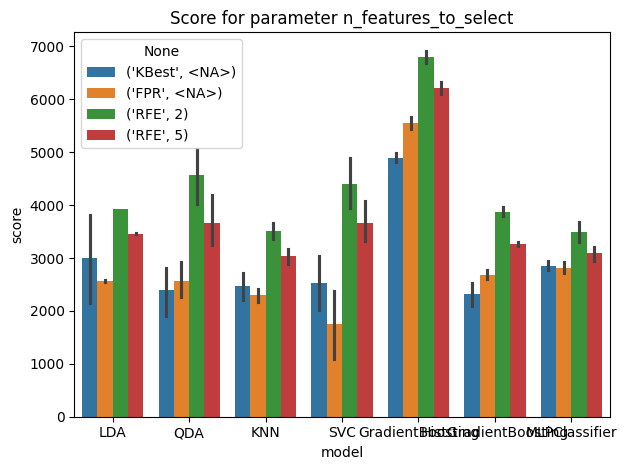

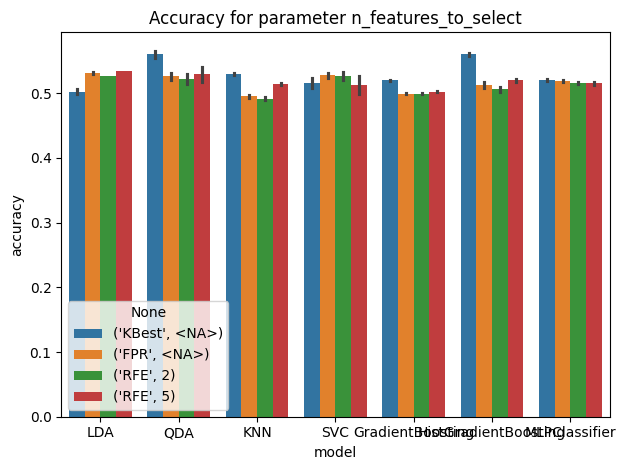

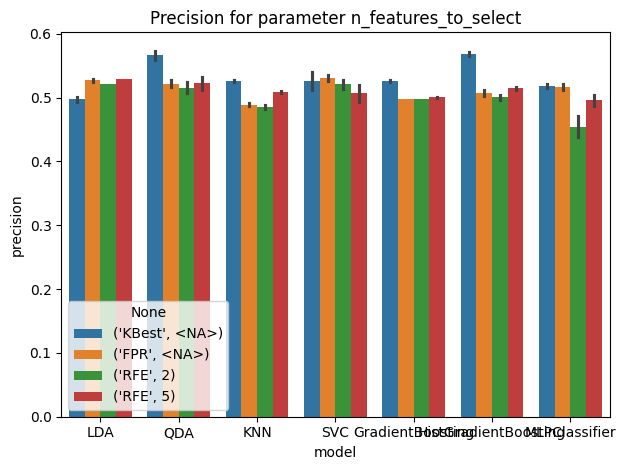

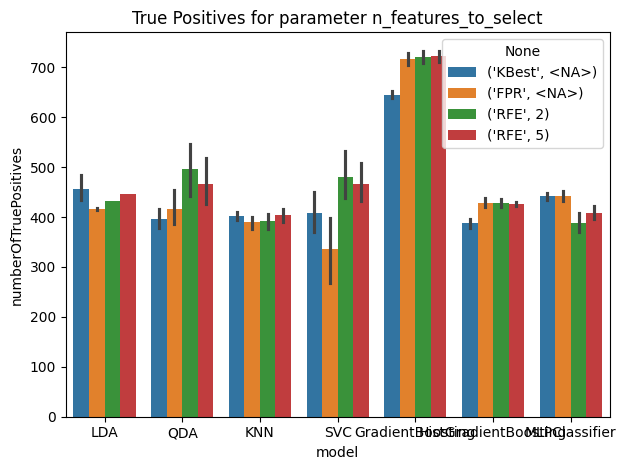

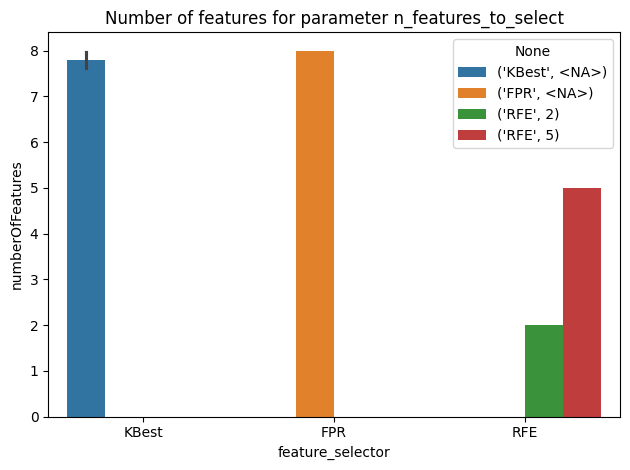

...

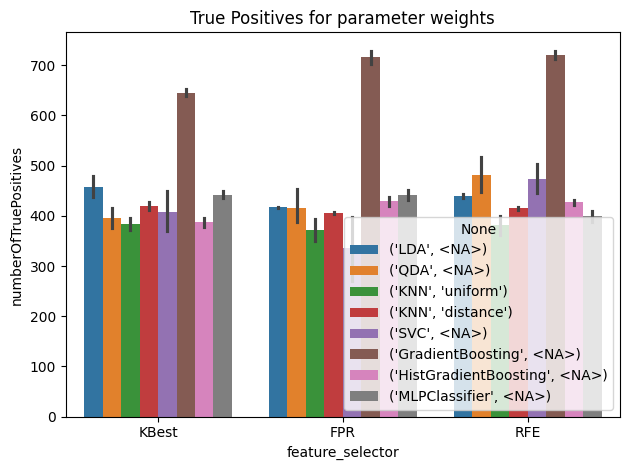

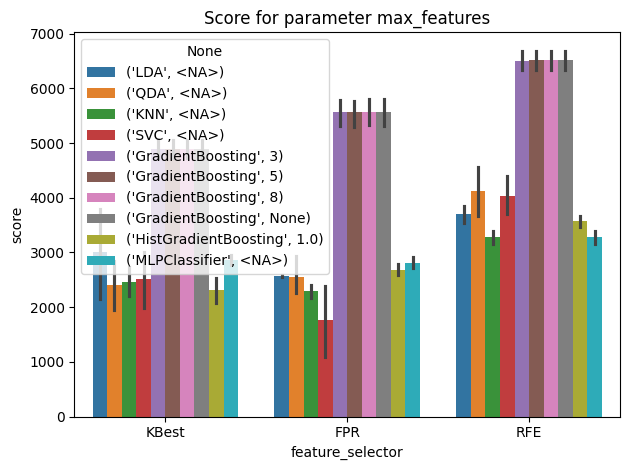

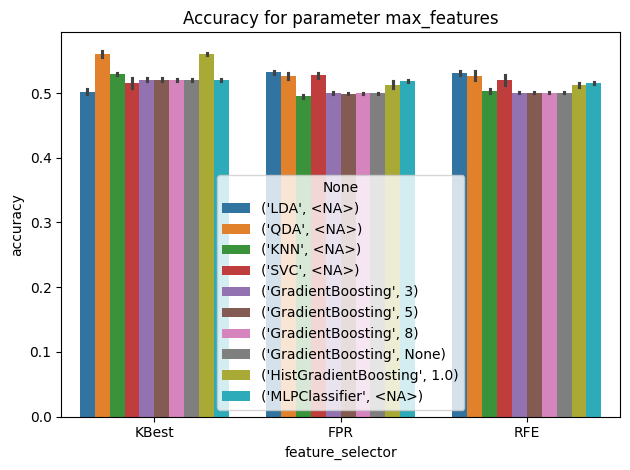

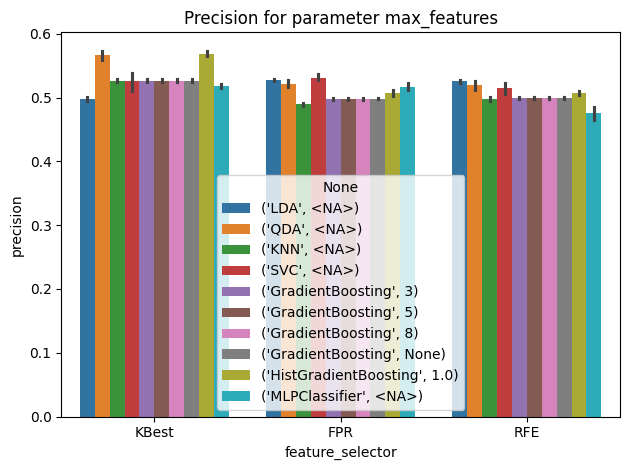

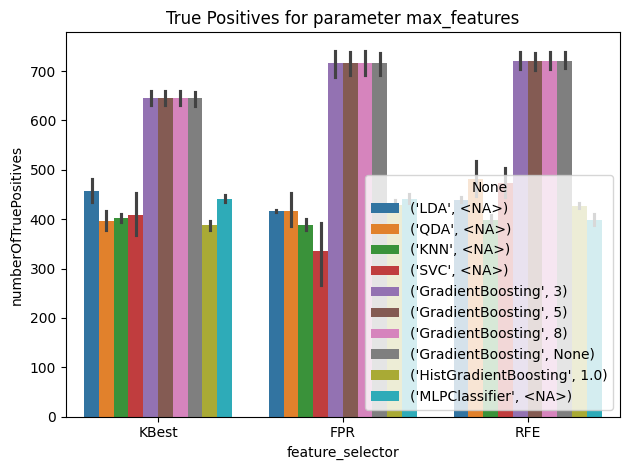

CPU times: total: 37.1 s
Wall time: 1min 8s


In [19]:
%%time
processedResultsDf, parameters = functions.extractParameterResults(
    resultsDf, models, featureSelectors
)
functions.drawParameterResultsBarplot(processedResultsDf, parameters)

### Score/Accuracy by number of features

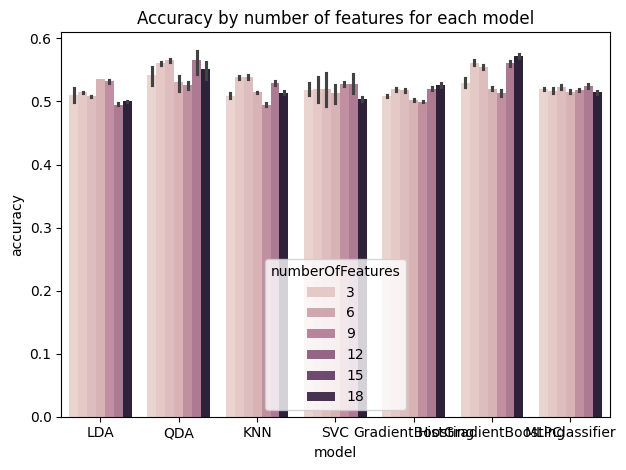

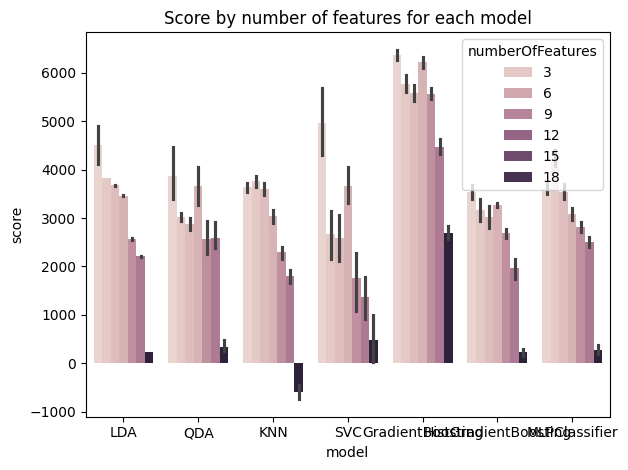

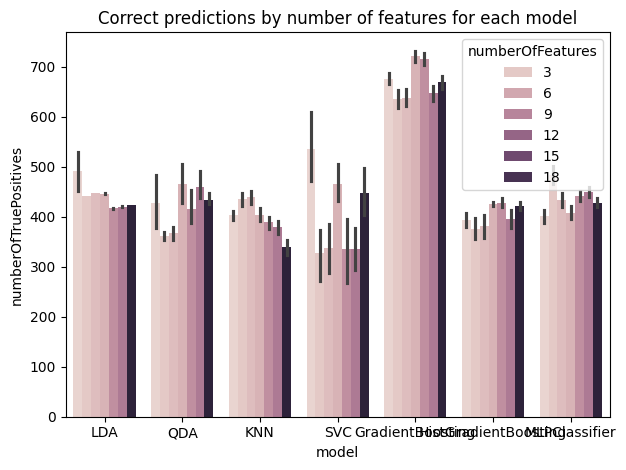

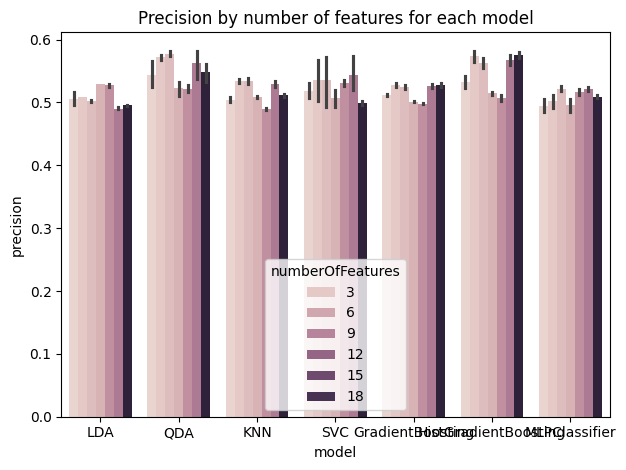

In [20]:
functions.drawResultsPerNumberOfFeatures(processedResultsDf)

### Final Results for Feature Selectors

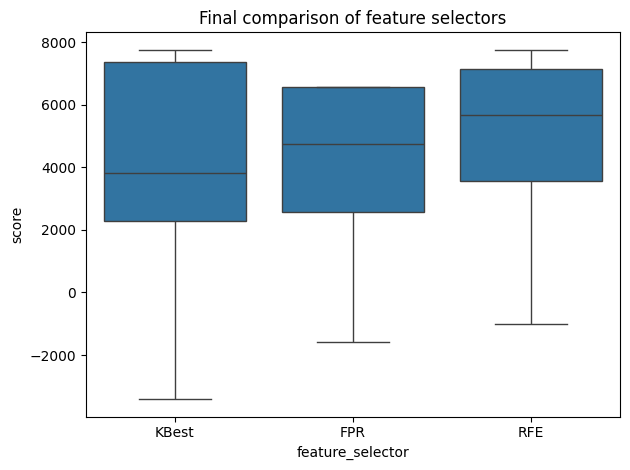

In [21]:
plt.title("Final comparison of feature selectors")
sns.boxplot(data=processedResultsDf, x="feature_selector", y="score")

plt.tight_layout()
plt.show()

### Final Results for Models

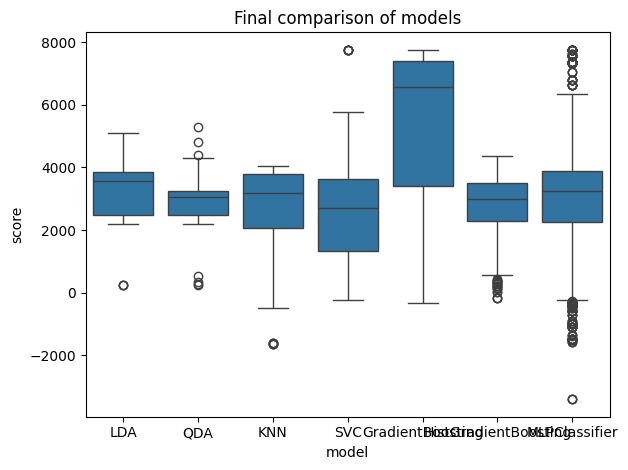

In [22]:
plt.title("Final comparison of models")
sns.boxplot(data=processedResultsDf, x="model", y="score")
plt.tight_layout()
plt.show()

### Final Results

In [23]:
%%time
filteredDf = functions.filterDataframeByBestResults(processedResultsDf)

CPU times: total: 0 ns
Wall time: 11.3 ms


In [24]:
filteredDf

,score,numberOfTruePositives,accuracy,precision,numberOfFeatures,model,model_parameters,feature_selector,selector_parameters,selector_parameters_n_features_to_select,...,model_parameters_alpha,model_parameters_learning_rate,model_parameters_n_neighbors,model_parameters_learning_rate_init,model_parameters_p,model_parameters_random_state,model_parameters_ccp_alpha,model_parameters_subsample,model_parameters_weights,model_parameters_max_features
43,7760,816,0.494545,0.494545,2,SVC,"{'C': 0.5, 'kernel': 'linear'}",KBest,{'score_func': <function mutual_info_classif a...,<NA>,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
46,7760,816,0.494545,0.494545,2,SVC,"{'C': 0.5, 'kernel': 'poly'}",KBest,{'score_func': <function mutual_info_classif a...,<NA>,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
47,7760,816,0.494545,0.494545,2,SVC,"{'C': 1.0, 'kernel': 'linear'}",KBest,{'score_func': <function mutual_info_classif a...,<NA>,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
50,7760,816,0.494545,0.494545,2,SVC,"{'C': 1.0, 'kernel': 'poly'}",KBest,{'score_func': <function mutual_info_classif a...,<NA>,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
51,7760,816,0.494545,0.494545,2,SVC,"{'C': 1.5, 'kernel': 'linear'}",KBest,{'score_func': <function mutual_info_classif a...,<NA>,...,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>,<NA>
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7914,7760,816,0.494545,0.494545,2,MLPClassifier,"{'activation': 'identity', 'solver': 'sgd', 'a...",RFE,"{'estimator': SVC(kernel='linear'), 'n_feature...",2,...,0.01,invscaling,<NA>,0.01,<NA>,42,<NA>,<NA>,<NA>,<NA>
7923,7760,816,0.494545,0.494545,2,MLPClassifier,"{'activation': 'identity', 'solver': 'sgd', 'a...",RFE,"{'estimator': SVC(kernel='linear'), 'n_feature...",2,...,0.0001,invscaling,<NA>,0.01,<NA>,42,<NA>,<NA>,<NA>,<NA>
8067,7760,816,0.494545,0.494545,2,MLPClassifier,"{'activation': 'tanh', 'solver': 'sgd', 'alpha...",RFE,"{'estimator': SVC(kernel='linear'), 'n_feature...",2,...,0.001,invscaling,<NA>,0.01,<NA>,42,<NA>,<NA>,<NA>,<NA>
8076,7760,816,0.494545,0.494545,2,MLPClassifier,"{'activation': 'tanh', 'solver': 'sgd', 'alpha...",RFE,"{'estimator': SVC(kernel='linear'), 'n_feature...",2,...,0.01,invscaling,<NA>,0.01,<NA>,42,<NA>,<NA>,<NA>,<NA>
